# Modeing Rating and Reviews data

**PACKAGES**

In [258]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

import datetime

import os
import pickle
import time
from tqdm.notebook import tqdm

from fuzzywuzzy import fuzz
import textdistance

import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

**CODE PARAMETERS**

In [105]:
# PANDAS DISPLAY PARAMETERS
# Setting the number of maximum columns and rows to display
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
# pd.set_option('display.width', None)
# pd.set_option('display.max_colwidth', 1)

In [3]:
# PATHS FOR RATINGS AND REVIEWS
input_reviews_dir_path = r'../data/raw_data/Rating and Reviews/'
output_reviews_dir_path = r'../data/clean_data/'

# PATHS FOR PRODUCT CATALOGUE
input_product_dir_path = r'../data/raw_data/Product Catalogue/'
output_product_dir_path = r'../data/clean_data/'

# PATHS FOR DEMAND
input_demand_dir_path = r'../data/raw_data/Demand Data/'
output_demand_dir_path = r'../data/clean_data/'

# PATHS FOR BRAND MAPPINGS
input_brands_dir_path = r'../data/clean_data/'
output_brands_dir_path = r'../data/clean_data/'

# PATHS FOR SUBCATEGORIES MAPPINGS
input_sub_categories_dir_path = r'../data/clean_data/'
output_sub_categories_dir_path = r'../data/clean_data/'

In [257]:
code_start = time.time()
tqdm.pandas()

## Data Wrangling

**Quick explanation:**

The data is broken into *Product Catalogues* and *Ratings and Reviews*. *Product Catalogues* contain data about the products. Ratings and Reviews contain data about reviews (EZ). Each of the two are broken into *skincare* and *cosmetics*. The granularity of the data is *Brand* and *Sub Category* also called *ELC Solution Type* (lipstick, gloss etc.). The *Rating and Reviews* data contains the *ELC Solution Type* column but does not contain the *Brand* column. The *Brand* can be retrived from the *Product Catalogue*.

Therefore, we need to join the *Rating and Reviews* data with the *Product Catalogue* then join that to the demand data and finally apply our models.

NB: The *Product Catalogues* and *Ratings and Reviews* files get uploaded to a shared folder once in a while. The *demand* data is downloaded from a certain server.

### Wrangling Demand Data

Before this code, I manually deleted the first row of the xlsx file and saved it as a .csv file. A lot of formating needs to be done to transform the data into a Pandas friendly DataFrame.

#### Read data

In [34]:
# Read data
demand = pd.read_csv(os.path.join(input_demand_dir_path,'full_demand.csv'), encoding="ISO-8859-1")

#### Data description

The demand data is a bit messy, all the number are in text format. The brands are represented using abbreviations but we have a mapping between brands and there abbreviation. 

In [6]:
print("DATA SAMPLE:")
display(demand.sample(3))
print("DATA DESCRIPTION:")
display(demand.describe(include='all'))

DATA SAMPLE:


,Brand,ItemID 4,Item Description,Affiliate,Major Category,Category,Sub Category,Application,7/1/2016,8/1/2016,9/1/2016,10/1/2016,11/1/2016,12/1/2016,1/1/2017,2/1/2017,3/1/2017,4/1/2017,5/1/2017,6/1/2017,7/1/2017,8/1/2017,9/1/2017,10/1/2017,11/1/2017,12/1/2017,1/1/2018,2/1/2018,3/1/2018,4/1/2018,5/1/2018,6/1/2018,7/1/2018,8/1/2018,9/1/2018,10/1/2018,11/1/2018,12/1/2018,1/1/2019,2/1/2019,3/1/2019,4/1/2019,5/1/2019,6/1/2019,7/1/2019,8/1/2019,9/1/2019,10/1/2019,11/1/2019,12/1/2019,1/1/2020,2/1/2020,3/1/2020,4/1/2020,5/1/2020,6/1/2020
3871,CL,K399,EVEN BETTER BRIGHTR ESSENCE LTN,UK AFFILIATE,Skincare,Watery /Treatment/Es,All Watery /Treatmen,Face,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,46,-,-,-,-,21,-,-,-,3,3,6,6,4,-,3,2,2
38577,LL,J1C9,V46 EDP RM,US,Fragrance,Juices,EDP,All Fragrance Juices,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,3,6,18,12,12,9,21,23,3,-,-,-,-,-,18,12
18753,AV,AG51,CALMNESS'14,US,Skincare,Cross Application Se,All Cross Applicatio,CROSS APPLICATION SE,-,-,-,432,-,-,-,-,-,-,"3,888",-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-


DATA DESCRIPTION:


,Brand,ItemID 4,Item Description,Affiliate,Major Category,Category,Sub Category,Application,7/1/2016,8/1/2016,9/1/2016,10/1/2016,11/1/2016,12/1/2016,1/1/2017,2/1/2017,3/1/2017,4/1/2017,5/1/2017,6/1/2017,7/1/2017,8/1/2017,9/1/2017,10/1/2017,11/1/2017,12/1/2017,1/1/2018,2/1/2018,3/1/2018,4/1/2018,5/1/2018,6/1/2018,7/1/2018,8/1/2018,9/1/2018,10/1/2018,11/1/2018,12/1/2018,1/1/2019,2/1/2019,3/1/2019,4/1/2019,5/1/2019,6/1/2019,7/1/2019,8/1/2019,9/1/2019,10/1/2019,11/1/2019,12/1/2019,1/1/2020,2/1/2020,3/1/2020,4/1/2020,5/1/2020,6/1/2020
count,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426,42426
unique,21,17865,16759,4,5,92,204,23,3367,3849,4248,4011,4217,3987,3418,3711,3926,3507,3695,4013,3165,3776,3882,3853,3913,3705,3153,3418,3716,3337,3332,3696,2886,3354,3821,3644,3873,3437,3194,3295,3547,3328,3396,3655,3092,3388,3676,3867,3720,3412,3173,3208,2976,2317,2063,2328
top,EL,0KWP,LIPSTICK,US,Makeup,Juices,EDP,Face,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-
freq,5740,22,165,15769,12934,7503,4796,11314,30724,30012,29416,29467,29349,29331,29947,30009,29709,29936,29621,29259,30692,30116,29708,29609,29508,29950,30578,30697,30140,30617,30586,30420,31439,30626,30120,30364,30080,30558,30839,31026,29904,30285,29997,29633,30582,30125,29421,29054,29662,29929,30357,30659,30712,31814,31725,31073


#### Data wrangling

In [95]:
# Read data
demand = pd.read_csv(os.path.join(input_demand_dir_path,'full_demand.csv'), encoding="ISO-8859-1")

In [96]:
# Pandas friendly column names
demand.columns = [col.lower().strip().replace(' ','_') for col in demand.columns]

In [97]:
# We extract the columns that contain demand data. They have the format (dd/mm/yyy)
# TODO: use regex. Bleh
dates_columns = demand.columns[demand.columns.str.contains('/')].tolist()

In [98]:
# In xlsx 0 is marked as '-' which cause the demand columns to be read as of type object (str).
# We need to replace the '-' by 0 and transform the type to int so that we can aggregate using sum().
temp = demand[dates_columns]
temp[temp == '-'] = 0
demand[dates_columns] = temp
del temp

C:\Users\asaid\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
C:\Users\asaid\Anaconda3\lib\site-packages\pandas\core\frame.py:2986: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._where(-key, value, inplace=True)


In [99]:
demand[demand=='-'] = np.nan

C:\Users\asaid\Anaconda3\lib\site-packages\pandas\core\ops\array_ops.py:253: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  res_values = method(rvalues)


In [100]:
demand = demand.dropna()

In [108]:
groupbycols = [
    'brand',
    'itemid_9',
    'item_description',
    'affiliate',
    'major_category_id',
    'major_category',
    'application_id',
    'application',
    'category_id',
    'category',
    'sub_category_id',
    'sub_category',
    'product_line_id',
    'product_line',
    'sub_product_line_id',
    'sub_product_line',
    'major_inventory',
    'inventory']

In [110]:
# We aggregate the data
# demand = demand.groupby(groupbycols)[dates_columns].sum()
demand = demand.set_index(groupbycols)

# Finally we use stack to create a columns date, and have a row for each seperate month
demand.columns.name = 'date'
demand = demand.stack().to_frame('demand').reset_index()
demand['date'] = pd.to_datetime(demand['date'], errors='coerce').values.astype('datetime64[M]')

In [ ]:
demand['demand'] = demand['demand'].str.replace(',','').fillna(0).astype(int)

In [111]:
demand.sample(10)

,brand,itemid_9,item_description,affiliate,major_category_id,major_category,application_id,application,category_id,category,sub_category_id,sub_category,product_line_id,product_line,sub_product_line_id,sub_product_line,major_inventory,inventory,date,demand
3034274,BK,H1AP011000,FL BRING ON THE BRONZE,US,510,Makeup,40,Face Color,2B,Bronzer,20,All Bronzer,66,Flirt,861,FLIRT-all other,Saleable,Standard Saleable,2015-09-01,0
1611579,AV,A1TF01J000,SHAMPURE CONDITIONER,US,540,Haircare,37,Hair Care,68,Conditioner,92,All Other,390,Shampure,72,All Shampure,Saleable,Standard Saleable,2016-10-01,0
2511273,JM,L4W9010000,BODY & HAND WASH GRAPEFRUIT,US,530,Fragrance,97,Fragranced Body & Ha,86,Fragranced Bath,58,Cleansers(Incl Soap),240,CORE SCENTS,487,Grapefruit,Saleable,Standard Saleable,2014-04-01,0
2216717,BB,EGNH900000,BOBBI TO GO 5,US,510,Makeup,15,Eyes,96,Cross Category Sets,6A,All Cross Category S,53,Bobbi Brown,775,Bobbi Brown,Promotional,Gifts,2016-12-01,0
2862679,DA,D7J2010000,THE REVITALIZING OIL,US,520,Skincare,25,Face,3A,Face Oil,S1,All Face Oils,265,Essential Oil Elixir,928,Essential Oil Elixir,Saleable,Standard Saleable,2017-02-01,145
3002825,KL,N3E6010000,LOVE DONT BE SHY EDP,US,530,Fragrance,92,All Fragrance Juices,61,Juices,52,EDP,525,Love,K77,Love,Saleable,Standard Saleable,2019-12-01,0
2157757,BB,E2LE131000,SKIN FOUNDATION SPF 15 PA+,US,510,Makeup,25,Face,28,Foundation,26,Liquid Foundation,315,Skin,H19,All Skin,Saleable,Standard Saleable,2017-08-01,444
2159542,BB,ENXK901000,BRONZE SB W BRUSH,US,510,Makeup,40,Face Color,2B,Bronzer,20,All Bronzer,53,Bobbi Brown,775,Bobbi Brown,Promotional,Gifts,2019-05-01,"1,181"
204123,CL,KA3P901000,CL F18 NA GWP GIFT 6A,US,520,Skincare,95,CROSS MAJOR CATEGORY,92,Cross Major Category,6B,All Cross Major Cate,15,Clinique,200,All Other Clinique Products,Promotional,Gifts,2013-10-01,0
1626852,SX,C023061000,CAMERA READY BB CREAM SPF 35,US,510,Makeup,25,Face,28,Foundation,B1,Cream Foundation,183,Camera Ready,A53,Camera Ready BB,Saleable,Standard Saleable,2015-07-01,"2,468"


In [112]:
demand.to_csv(os.path.join(output_demand_dir_path,'demand.csv'), index=False)

In [113]:
# If the wrangled files already exist
demand = pd.read_csv(os.path.join(output_demand_dir_path,'demand.csv'))
demand.sample(10)

C:\Users\asaid\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (6,8,19) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,brand,itemid_9,item_description,affiliate,major_category_id,major_category,application_id,application,category_id,category,sub_category_id,sub_category,product_line_id,product_line,sub_product_line_id,sub_product_line,major_inventory,inventory,date,demand
2878756,DA,D829Y60000,INTRAL XMAS SET FY17-WN,US,520,Skincare,94,CROSS APPLICATION SE,95,Cross Application Se,64,All Cross Applicatio,271,Intral - Sensitive,907,Intral - Sensitive Skin,Saleable,Standard Saleable,2019-11-01,0
428937,MC,S47PC00000,LIPGLASS,US,510,Makeup,10,Lips,12,Lip Gloss,18,All Lip Gloss,215,Traditional,E68,All Traditional Products,Saleable,Standard Saleable,2016-04-01,0
2044980,AR,5FM9901000,CM GOLD BAG,US,590,Other,99,All Other Applicatio,90,Accessories,35,Bags / Totes,431,Cashmere Mist,406,Cashmere Mist Core,Promotional,Gifts,2013-07-01,0
3079771,FM,H497010000,PORTRAIT OF A LADY,US,530,Fragrance,92,All Fragrance Juices,61,Juices,52,EDP,551,Parfums-Editions,M23,PORTRAIT OF A LADY,Saleable,Standard Saleable,2020-02-01,99
354905,CL,ZR7Y010000,DDMC MINI,US,520,Skincare,25,Face,31,Moisturizers,80,Moisturizers,16,3 Step,606,DDMC,Saleable,Standard Saleable,2013-12-01,0
2189714,BB,EELP010000,NUDE FINISH ILLUMINATING POWDER,US,510,Makeup,25,Face,26,Face Powder,A2,Pressed Face Powder,53,Bobbi Brown,775,Bobbi Brown,Saleable,Standard Saleable,2013-09-01,0
2470332,BU,B373Y91000,READY SET FETE HIO DUO,US,540,Haircare,36,Hair Styling,96,Cross Category Sets,6A,All Cross Category S,132,Bumble and bumble,C24,Hairdresser's Invisible Oil,Saleable,Standard Saleable,2018-07-01,0
2314553,BB,EHRA010000,BRONZER / FACE BLENDER,US,510,Makeup,90,All Other Makeup App,2G,Brushes,MM,Face Brushes,53,Bobbi Brown,775,Bobbi Brown,Saleable,Standard Saleable,2014-12-01,0
2639232,CM,5R0P410000,REGENERATING SERUM-WN,US,520,Skincare,25,Face,41,Serums & Essences,ZK,All Other Serums & E,56,La Mer,575,All La Mer,Promotional,Samples,2016-07-01,0
858434,MC,SKEC170000,POWERGLASS PLUMPING GLOSS-WN,US,510,Makeup,10,Lips,12,Lip Gloss,18,All Lip Gloss,57,MAC,700,MAC,Saleable,Standard Saleable,2016-09-01,0


### Wrangling Rating and Reviews

#### Read and concatenate data

First we need to read all the files and concatenate them.

In [11]:
# List of available files
os.listdir(input_reviews_dir_path)

['cosmetics_reviews_20191130_final.csv',
 'cosmetics_reviews_20200101-20200131.csv',
 'cosmetics_reviews_20200229.csv',
 'cosmetics_reviews_20200331.csv',
 'old_files',
 'pwds',
 'skincare_reviews_20150201-20200131.csv',
 'skincare_reviews_20200229.csv',
 'skincare_reviews_20200331.csv',
 'template']

In [12]:
start = time.time()
reviews_skincare = pd.DataFrame()
reviews_cosmetics = pd.DataFrame()
for file in os.listdir(input_reviews_dir_path):
    if '.csv' in file.lower():
        if 'skincare' in file.lower():
            interm = time.time()
            print('\nReading', file)
            temp = pd.read_csv(os.path.join(input_reviews_dir_path,file), low_memory=False)
            temp = temp.loc[:, ~temp.columns.str.contains('^Unnamed')]
            temp.columns = [colname.lower().replace(' ','_') for colname in temp.columns]
            print('Concatenating', file)
            reviews_skincare=pd.concat([reviews_skincare, temp], ignore_index=True)
            print('Time for this dataset: %.0f seconds' % (time.time()-interm))
            print('Total time: %.0f seconds' % (time.time()-start))
        elif 'cosmetics' in file.lower():
            interm = time.time()
            print('\nReading', file)
            temp = pd.read_csv(os.path.join(input_reviews_dir_path,file), low_memory=False)
            temp = temp.loc[:, ~temp.columns.str.contains('^Unnamed')]
            temp.columns = [colname.lower().replace(' ','_') for colname in temp.columns]
            print('Concatenating', file)
            reviews_cosmetics=pd.concat([reviews_cosmetics, temp], ignore_index=True)
            print('Time for this dataset: %.0f seconds' % (time.time()-interm))
            print('Total time: %.0f seconds' % (time.time()-start))
del temp


Reading cosmetics_reviews_20191130_final.csv
Concatenating cosmetics_reviews_20191130_final.csv
Time for this dataset: 216 seconds
Total time: 216 seconds

Reading cosmetics_reviews_20200101-20200131.csv
Concatenating cosmetics_reviews_20200101-20200131.csv
Time for this dataset: 59 seconds
Total time: 274 seconds

Reading cosmetics_reviews_20200229.csv
Concatenating cosmetics_reviews_20200229.csv
Time for this dataset: 61 seconds
Total time: 335 seconds

Reading cosmetics_reviews_20200331.csv
Concatenating cosmetics_reviews_20200331.csv
Time for this dataset: 62 seconds
Total time: 397 seconds

Reading skincare_reviews_20150201-20200131.csv
Concatenating skincare_reviews_20150201-20200131.csv
Time for this dataset: 36 seconds
Total time: 433 seconds

Reading skincare_reviews_20200229.csv
Concatenating skincare_reviews_20200229.csv
Time for this dataset: 8 seconds
Total time: 441 seconds

Reading skincare_reviews_20200331.csv
Concatenating skincare_reviews_20200331.csv
Time for this d

In [13]:
reviews_cosmetics = reviews_cosmetics.drop_duplicates()
reviews_skincare = reviews_skincare.drop_duplicates()

In [14]:
reviews_cosmetics.to_csv(os.path.join(output_reviews_dir_path,'reviews_cosmetics.csv'), index=False)
reviews_skincare.to_csv(os.path.join(output_reviews_dir_path,'reviews_skincare.csv'), index=False)

In [156]:
# If concatenated files already exist
reviews_cosmetics = pd.read_csv(os.path.join(output_reviews_dir_path,'reviews_cosmetics.csv'))
reviews_skincare = pd.read_csv(os.path.join(output_reviews_dir_path,'reviews_skincare.csv'))

C:\Users\asaid\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (1,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\asaid\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (23,25,28,29,30,33,34,35,36,37,38) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


#### Data description

Each review/post has a unique *OnlinePost_ID*. Each *OnlinePost_ID* is broken into different *Statements*. Each statement has a unique *OnlineStatement_ID* which is the concatenation of the *OnlineStatement_ID* and the rank of the statement. A statement is usually a sentence or a comment. The actual text is contained in the *Description* column.

The Reviews data and the Products data must be joined using *Source Product Identifier* and *Channel* as a compounded key.

**COSMETICS**

In [16]:
print("DATA SAMPLE:")
display(reviews_cosmetics.sample(3))
print("DATA DESCRIPTION:")
display(reviews_cosmetics.describe(include='all'))
print("% OF MISSING DATA:")
display((reviews_cosmetics.isna().sum()/len(reviews_cosmetics))*100)

DATA SAMPLE:


,onlinepost_id,source_product_identifier,onlinestatement_id,date,title,description,geography,channel,product_id,rating,sentiment,feature,benefit,ingredient,additional_ingredients_(no_rulebase),product_form,elc_solution_type,finish,looks,other,trends,syndication_source,best_for,verified_buyer,from,recommended,verified_reviewer,eye_color,hair_color,skin_tone,gender,i_shop_at_macys.com,make-up_style,purchase_location,cons,pros,describe_yourself,reviewer_skin_type,age
8053491,OnlinePost_20190724_159633855,3761879,OnlineStatement_20190724_159633855_4,2017-07-25,Great Brow Tint,"I have fair brows and can tint, shape and set ...",USA,Nordstrom,Product_20191016_5328568,5.0,Neutral,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Gel,Eyebrow Liner/Shaper,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Original Source,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3247261,OnlinePost_20191027_185254517,xlsImpprod10791965,OnlineStatement_20191027_185254517_8,2018-07-06,Something has changed with this mascara.,Then it is just a mess to try and scrape it off.,USA,Ulta,Product_20191024_5593267,1.0,Positive,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Wipe,Mascara,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,CLINIQUE,NaN,False,"Dallas, Tx",No,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7800823,OnlinePost_20191027_181751107,87190,OnlineStatement_20191027_181751107_7,2018-02-22,Face Love it!,not all Women of color red 'red' as background...,USA,Bloomingdales,Product_20191016_5165532,5.0,Negative,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Tinted Moisturizer,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,LAURA MERCIER,NaN,NaN,Colorado,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN


DATA DESCRIPTION:


,onlinepost_id,source_product_identifier,onlinestatement_id,date,title,description,geography,channel,product_id,rating,sentiment,feature,benefit,ingredient,additional_ingredients_(no_rulebase),product_form,elc_solution_type,finish,looks,other,trends,syndication_source,best_for,verified_buyer,from,recommended,verified_reviewer,eye_color,hair_color,skin_tone,gender,i_shop_at_macys.com,make-up_style,purchase_location,cons,pros,describe_yourself,reviewer_skin_type,age
count,15505326,15505326,15505326,15505326,15048828,15505326,15505326,15505326,15505326,1.550532e+07,15505326,15505326,15505326,15505326,15505326,15505326,15505326,15505326,15505326,15505326,15505326,15505326,960876,1781595,6312505,4241554,1781595,2664384,2137413,2711189,82190,17043,37075,48644,456713,1645667,1046150,2374785,872303
unique,3718332,45195,15505326,1917,1221271,10486362,2,12,67659,NaN,3,983,9565,101,174,406,40,210,262,20,101,123,11052,2,84342,9,2,5,6,9,2,1,3,2,28446,32632,5397,4,12
top,OnlinePost_20191218_196195647,19955,OnlineStatement_20200123_dd41bfc2-99e4-442e-8b...,2016-06-14,None,[This review was collected as part of a promot...,USA,Birchbox,Product_20191016_5458191,NaN,Positive,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Mascara,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Original Source,Anytime,False,None,True,False,Brown,Brunette,Light,Female,Occasionally,Natural,Online,Wears Off Easily,None,Natural Style,Combination,25-34
freq,36,201329,1,37960,702320,168281,13566615,4236243,201329,NaN,11968623,14628481,12883031,15491767,15497063,4526149,1926875,14404010,15458737,15496000,15234225,12591524,111699,918023,3248315,2067846,1493940,1359637,1050441,793929,81524,17043,25834,27627,22293,536505,322864,1247883,303231
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.166802e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.204049e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


% OF MISSING DATA:


onlinepost_id                            0.000000
source_product_identifier                0.000000
onlinestatement_id                       0.000000
date                                     0.000000
title                                    2.944137
description                              0.000000
geography                                0.000000
channel                                  0.000000
product_id                               0.000000
rating                                   0.000052
sentiment                                0.000000
feature                                  0.000000
benefit                                  0.000000
ingredient                               0.000000
additional_ingredients_(no_rulebase)     0.000000
product_form                             0.000000
elc_solution_type                        0.000000
finish                                   0.000000
looks                                    0.000000
other                                    0.000000


**REVIEWS**

In [17]:
print("DATA SAMPLE:")
display(reviews_skincare.sample(3))
print("DATA DESCRIPTION:")
display(reviews_skincare.describe(include='all'))
print("% OF MISSING DATA:")
display((reviews_skincare.isna().sum()/len(reviews_skincare))*100)

DATA SAMPLE:


,onlinepost_id,source_product_identifier,onlinestatement_id,date,title,description,geography,channel,product_id,rating,sentiment,feature,benefit,ingredient,additional_ingredients_(no_rulebase),product_form,elc_solution_type,skin_condition,packaging,skin_type,treatment_area,use_case,syndication_source,best_for,verified_buyer,from,recommended,verified_reviewer,eye_color,hair_color,skin_tone,gender,i_shop_at_macys.com,make-up_style,purchase_location,cons,pros,describe_yourself,reviewer_skin_type,age
2274936,OnlinePost_20191120_140604164,B00AFX1TZ2,OnlineStatement_20191120_140604164_3,2017-07-11,My wife says it's OK. Not much of a ...,Not much of a difference to her original lip c...,USA,Amazon USA,Product_20191016_14017897,3.0,Negative,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Balm;Butter,Unspecified Lip Skincare,Not Mentioned,Not Mentioned,Not Mentioned,Lips,Not Mentioned,Original Source,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3458149,OnlinePost_20200219_898d2f27-5f0b-45dd-87f8-71...,B00IH0ATYC,OnlineStatement_20200219_898d2f27-5f0b-45dd-87...,2020-01-26,Scent is awesome!!,Love this product!,USA,Amazon USA,Product_20200109_15219364,5.0,Positive,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Butter,Exfoliator,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Original Source,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2009748,OnlinePost_20191120_139924664,B075VX4QVM,OnlineStatement_20191120_139924664_3,2019-08-17,Love all their products!,I discovered their mascara which is perfect an...,USA,Amazon USA,Product_20191016_13395955,5.0,Positive,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Liquid,Serum,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Original Source,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


DATA DESCRIPTION:


,onlinepost_id,source_product_identifier,onlinestatement_id,date,title,description,geography,channel,product_id,rating,sentiment,feature,benefit,ingredient,additional_ingredients_(no_rulebase),product_form,elc_solution_type,skin_condition,packaging,skin_type,treatment_area,use_case,syndication_source,best_for,verified_buyer,from,recommended,verified_reviewer,eye_color,hair_color,skin_tone,gender,i_shop_at_macys.com,make-up_style,purchase_location,cons,pros,describe_yourself,reviewer_skin_type,age
count,4107027,4107027,4107027,4107027,4084200,4107027,4107027,4107027,4107027,4.107027e+06,4107027,4107027,4107027,4107027,4107027,4107027,4107027,4107027,4107027,4107027,4107027,4107027,4107027,2693,0.0,197076,176517,0.0,149289,150874,152565,10659,0.0,27,30,3536,23342,3291,100862,58557
unique,1290176,36465,4107027,1886,519304,3005616,2,12,55624,NaN,3,961,4272,768,277,1054,24,4415,16,91,333,4,108,449,NaN,2365,7,NaN,5,6,9,2,NaN,3,1,563,1159,525,4,23
top,OnlinePost_20191120_134651626,B07R7RZXJJ,OnlineStatement_20200301_13d8c7bd-7f77-495b-86...,2020-01-18,Five Stars,Five Stars.,USA,Amazon USA,Product_20191016_13953897,NaN,Positive,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Cream,Face Moisturizer,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Original Source,Everyday,NaN,None,True,NaN,Brown,Brunette,Light,Female,NaN,Natural,Online,None,None,Combination skin,Combination,30to45
freq,39,20648,1,11518,276495,121635,4009578,3702055,19755,NaN,3198497,3737589,3371523,4046160,4094217,646529,958668,3115937,4043725,3866402,3595634,4094189,3985639,121,NaN,161711,127546,NaN,74856,75356,44240,10375,NaN,17,30,158,17064,125,54924,15500
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.173652e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.342025e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


% OF MISSING DATA:


onlinepost_id                             0.000000
source_product_identifier                 0.000000
onlinestatement_id                        0.000000
date                                      0.000000
title                                     0.555804
description                               0.000000
geography                                 0.000000
channel                                   0.000000
product_id                                0.000000
rating                                    0.000000
sentiment                                 0.000000
feature                                   0.000000
benefit                                   0.000000
ingredient                                0.000000
additional_ingredients_(no_rulebase)      0.000000
product_form                              0.000000
elc_solution_type                         0.000000
skin_condition                            0.000000
packaging                                 0.000000
skin_type                      

#### Data wrangling

Here are some ideas about the aggregationg of R&R data :
1. Filter on Geography to only keep USA data
2. create date columns (year, month) 
3. change sentiment to numerical data : negative:-1, neurtal:0, positive:1
4. create sentiment one hot encodings 
5. groupby OnlineStatement_ID and aggregate by {sentiment:mean, sentiments_hot_one:average_count)
5. create rating one hot encodings
5. Groupby year, month, Channel, Source Product Identifier
6. Aggregate by {num_sentiment:mean, num_rating:mean, sentiments_hot_one:count, rating_hot_one:count}
7. Count the number of reviews

Then we concatenate cosmetic and skincare, and add a columns *type* to keep track of the source of the data.

**NB**: The columns are not exactly the same between the two types. By concatenting, we will have the union of the features of the two datasets and missing values will be filled with NaNs.

In [157]:
reviews_cosmetics['type'] = 'Cosmetics'
reviews_skincare['type'] = 'Skincare'
reviews = pd.concat([reviews_cosmetics, reviews_skincare], axis=0)


KeyboardInterrupt



In [ ]:
reviews.head(2)

In [20]:
# Filtering geographies on US
reviews = reviews[reviews['geography']=='USA']

In [21]:
# Creating date columns in the right dtype and dropping the day of the month: 2019-02-34 => 2019-02-01
reviews.loc[:,'clean_date'] = pd.to_datetime(reviews['date'], errors='coerce')
if reviews['clean_date'].isna().sum() > 0:
    print('{} rows have been dropped because the date format is wrong.'.format(reviews['clean_date'].isna().sum()))
    display(reviews.loc[reviews['clean_date'].isna(), 'date'])
    reviews = reviews.dropna(subset='date')
reviews['date'] = reviews['clean_date']  
reviews = reviews.drop('clean_date', axis=1)

In [22]:
# Checking for missing data (NA => -1)
if reviews['rating'].isna().sum()>0:
    print('{} rows are missing ratings'.format(reviews['rating'].isna().sum()))
    reviews.loc[:,'rating'] = reviews['rating'].fillna(-1).astype(int)

if reviews['sentiment'].isna().sum()>0:
    print('{} rows are missing sentiments'.format(reviews['sentiment'].isna().sum()))
    reviews.loc[:,'sentiment'] = reviews['sentiment'].fillna(-1).astype(int)

In [23]:
# Transforming rating and sentiment to dummy variables (one-hot encoding)
reviews.loc[:,'sentiment'] = reviews['sentiment'].str.lower()
reviews.loc[:,'rating'] = reviews['rating'].astype(int)
reviews = pd.concat([reviews, pd.get_dummies(data=reviews[['rating','sentiment']], columns=['rating','sentiment'], dtype=int)], axis=1)

In [24]:
# Readding NAs data to ratings
reviews.loc[reviews['rating']==-1,'rating'] = np.nan
reviews.loc[reviews['sentiment']==-1,'sentiment'] = np.nan

In [25]:
# Transforming sentiment to integer data (positive:1; netural:0, negative:-1)
reviews.loc[:,'sentiment'] = reviews['sentiment_positive'] - reviews['sentiment_negative']

In [26]:
# Aggregating RR data by OnlinePost_ID

# Creating a column to count the number of statements by review once aggreagtion happens
reviews['nb_statements'] = reviews['sentiment']

reviews = reviews.groupby(['type',
                             'channel',
                             'source_product_identifier',  
                             'date',
                             'onlinepost_id']).agg({
    'nb_statements':'count',
    'rating':'first',
    'rating_1':'first',
    'rating_2':'first',
    'rating_3':'first',
    'rating_4':'first',
    'rating_5':'first',
    'sentiment_negative':'sum',
    'sentiment_neutral':'sum',
    'sentiment_positive':'sum',
    'sentiment':'mean'
}).reset_index()

# Normalize the one hot sentiment encoding counts (sentiment_negative, sentiment_neutral, sentiment_positive) by the nb_statement.
reviews[['sentiment_negative', 'sentiment_neutral', 'sentiment_positive']] = reviews[['sentiment_negative', 'sentiment_neutral', 'sentiment_positive']].div(reviews['nb_statements'], axis=0)

In [27]:
reviews.head(4)

,type,channel,source_product_identifier,date,onlinepost_id,nb_statements,rating,rating_1,rating_2,rating_3,rating_4,rating_5,sentiment_negative,sentiment_neutral,sentiment_positive,sentiment
0,Cosmetics,Amazon USA,0001842420,2015-03-04,OnlinePost_20191121_187403578,2,5.0,0,0,0,0,1,0.0,0.0,1.0,1.0
1,Cosmetics,Amazon USA,0001842420,2015-04-04,OnlinePost_20191121_189046447,1,5.0,0,0,0,0,1,0.0,0.0,1.0,1.0
2,Cosmetics,Amazon USA,0001842420,2015-05-31,OnlinePost_20191121_188120318,2,5.0,0,0,0,0,1,0.0,0.0,1.0,1.0
3,Cosmetics,Amazon USA,0001842420,2015-06-03,OnlinePost_20191121_188840852,1,5.0,0,0,0,0,1,0.0,0.0,1.0,1.0


In [28]:
# Aggregating RR data by channel + source_product_identifier

# Creating a column to count the number of reviews once aggreagtion happens
reviews['nb_reviews'] = reviews['rating']
reviews['avg_nb_statements'] = reviews['nb_statements']

reviews = reviews.groupby(['type',
                           'channel',
                           'source_product_identifier',
                           'date']).agg({
    'avg_nb_statements':'mean',
    'nb_reviews':'count',
    'rating':'mean',
    'rating_1':'sum',
    'rating_2':'sum',
    'rating_3':'sum',
    'rating_4':'sum',
    'rating_5':'sum',
    'sentiment_negative':'sum',
    'sentiment_neutral':'sum',
    'sentiment_positive':'sum',
    'sentiment':'mean'
}).reset_index()

In [29]:
reviews.head(4)

,type,channel,source_product_identifier,date,avg_nb_statements,nb_reviews,rating,rating_1,rating_2,rating_3,rating_4,rating_5,sentiment_negative,sentiment_neutral,sentiment_positive,sentiment
0,Cosmetics,Amazon USA,0001842420,2015-03-04,2.0,1,5.0,0,0,0,0,1,0.0,0.0,1.0,1.0
1,Cosmetics,Amazon USA,0001842420,2015-04-04,1.0,1,5.0,0,0,0,0,1,0.0,0.0,1.0,1.0
2,Cosmetics,Amazon USA,0001842420,2015-05-31,2.0,1,5.0,0,0,0,0,1,0.0,0.0,1.0,1.0
3,Cosmetics,Amazon USA,0001842420,2015-06-03,1.0,1,5.0,0,0,0,0,1,0.0,0.0,1.0,1.0


In [30]:
# Saving dataset
reviews.to_csv(os.path.join(output_reviews_dir_path,'reviews_wrangled.csv'), index=False)

In [5]:
# If the wrangled files already exist
reviews = pd.read_csv(os.path.join(output_reviews_dir_path,'reviews_wrangled.csv'))
reviews.sample(10)

C:\Users\asaid\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (2) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,type,channel,source_product_identifier,date,avg_nb_statements,nb_reviews,rating,rating_1,rating_2,rating_3,rating_4,rating_5,sentiment_negative,sentiment_neutral,sentiment_positive,sentiment
111989,Cosmetics,Amazon USA,B008DF54RS,2019-08-23,3.0,1,1.0,1,0,0,0,0,1.0,0.000000,0.000000,-1.000000
1408018,Cosmetics,Ulta,xlsImpprod5770265,2016-04-21,2.0,1,3.0,0,0,1,0,0,0.0,0.000000,1.000000,1.000000
668339,Cosmetics,Nordstrom,3958385,2018-10-10,10.0,1,1.0,1,0,0,0,0,0.1,0.400000,0.500000,0.400000
730552,Cosmetics,Nordstrom,5280812,2019-06-22,3.0,1,1.0,1,0,0,0,0,0.0,0.333333,0.666667,0.666667
1903341,Skincare,Amazon USA,B00PFCTEH8,2017-07-01,2.0,1,3.0,0,0,1,0,0,0.0,0.500000,0.500000,0.500000
1925461,Skincare,Amazon USA,B00SH46VR2,2020-02-08,2.0,1,3.0,0,0,1,0,0,0.5,0.000000,0.500000,0.000000
368834,Cosmetics,Birchbox,23526,2016-11-02,4.0,1,5.0,0,0,0,0,1,0.0,0.000000,1.000000,1.000000
1563749,Skincare,Amazon USA,B002MSN3QQ,2018-05-01,6.0,2,4.5,0,0,0,1,1,0.0,0.285714,1.714286,0.857143
2138748,Skincare,Amazon USA,B072BYWFW8,2019-07-18,1.5,2,5.0,0,0,0,0,2,0.0,0.000000,2.000000,1.000000
2161933,Skincare,Amazon USA,B075QYGQDN,2019-02-18,1.0,1,1.0,1,0,0,0,0,0.0,0.000000,1.000000,1.000000


The Rating and Reviews data is now wrangled. We now need to wrangle the Product Catalogue data before merging the two datasets.

In [46]:
sorted(reviews['date'].unique().tolist())

['2014-12-01',
 '2014-12-02',
 '2014-12-03',
 '2014-12-04',
 '2014-12-05',
 '2014-12-06',
 '2014-12-07',
 '2014-12-08',
 '2014-12-09',
 '2014-12-10',
 '2014-12-11',
 '2014-12-12',
 '2014-12-13',
 '2014-12-14',
 '2014-12-15',
 '2014-12-16',
 '2014-12-17',
 '2014-12-18',
 '2014-12-19',
 '2014-12-20',
 '2014-12-21',
 '2014-12-22',
 '2014-12-23',
 '2014-12-24',
 '2014-12-25',
 '2014-12-26',
 '2014-12-27',
 '2014-12-28',
 '2014-12-29',
 '2014-12-30',
 '2014-12-31',
 '2015-01-01',
 '2015-01-02',
 '2015-01-03',
 '2015-01-04',
 '2015-01-05',
 '2015-01-06',
 '2015-01-07',
 '2015-01-08',
 '2015-01-09',
 '2015-01-10',
 '2015-01-11',
 '2015-01-12',
 '2015-01-13',
 '2015-01-14',
 '2015-01-15',
 '2015-01-16',
 '2015-01-17',
 '2015-01-18',
 '2015-01-19',
 '2015-01-20',
 '2015-01-21',
 '2015-01-22',
 '2015-01-23',
 '2015-01-24',
 '2015-01-25',
 '2015-01-26',
 '2015-01-27',
 '2015-01-28',
 '2015-01-29',
 '2015-01-30',
 '2015-01-31',
 '2015-02-01',
 '2015-02-02',
 '2015-02-03',
 '2015-02-04',
 '2015-02-

### Wrangling Product Catalogue

#### Read and concatenate data

First we need to read all the files and concatenate them.

In [32]:
# List of available files
os.listdir(input_product_dir_path)

['cosmetics_products_20200331.csv',
 'Cosmetics_Product_20190831.csv',
 'Cosmetics_Product_20190930.csv',
 'Cosmetics_Product_20191031.csv',
 'cosmetics_product_2019Q4.csv',
 'Cosmetics_Product_20200116.csv',
 'ELC_historic_catalog_cosmetics.b.csv',
 'ELC_historic_catalog_skincare.b.csv',
 'Hair Care.zip',
 'old_files',
 'skincare_products_20200331.csv',
 'SkinCare_Product_20190630_ST MV2SV.csv',
 'SkinCare_Product_20190930.csv',
 'SkinCare_Product_20190930_Update.csv',
 'SkinCare_Product_20191031.csv',
 'skincare_product_20191231.csv',
 'skincare_product_2019Q3.csv',
 'skincare_product_2019Q3_final.csv',
 'SkinCare_Product_20200116.csv']

In [33]:
start = time.time()
products_skincare = pd.DataFrame()
products_cosmetics = pd.DataFrame()
for file in os.listdir(input_product_dir_path):
    if '.csv' in file.lower():
        if 'skincare' in file.lower():
            interm = time.time()
            print('\nReading', file)
            temp = pd.read_csv(os.path.join(input_product_dir_path,file), low_memory=False)
            temp = temp.loc[:, ~temp.columns.str.contains('^Unnamed')]
            temp.columns = [colname.lower().replace(' ','_') for colname in temp.columns]
            print('Concatenating', file)
            products_skincare = pd.concat([products_skincare, temp], ignore_index=True)
            print('Time for this dataset: %.0f seconds' % (time.time()-interm))
            print('Total time: %.0f seconds' % (time.time()-start))
        elif 'cosmetics' in file.lower():
            interm = time.time()
            print('\nReading', file)
            temp = pd.read_csv(os.path.join(input_product_dir_path,file), low_memory=False)
            temp = temp.loc[:, ~temp.columns.str.contains('^Unnamed')]
            temp.columns = [colname.lower().replace(' ','_') for colname in temp.columns]
            print('Concatenating', file)
            products_cosmetics = pd.concat([products_cosmetics, temp], ignore_index=True)
            print('Time for this dataset: %.0f seconds' % (time.time()-interm))
            print('Total time: %.0f seconds' % (time.time()-start))
del temp


Reading cosmetics_products_20200331.csv
Concatenating cosmetics_products_20200331.csv
Time for this dataset: 1 seconds
Total time: 1 seconds

Reading Cosmetics_Product_20190831.csv
Concatenating Cosmetics_Product_20190831.csv
Time for this dataset: 14 seconds
Total time: 15 seconds

Reading Cosmetics_Product_20190930.csv
Concatenating Cosmetics_Product_20190930.csv
Time for this dataset: 1 seconds
Total time: 16 seconds

Reading Cosmetics_Product_20191031.csv
Concatenating Cosmetics_Product_20191031.csv
Time for this dataset: 1 seconds
Total time: 17 seconds

Reading cosmetics_product_2019Q4.csv
Concatenating cosmetics_product_2019Q4.csv
Time for this dataset: 1 seconds
Total time: 19 seconds

Reading Cosmetics_Product_20200116.csv
Concatenating Cosmetics_Product_20200116.csv
Time for this dataset: 1 seconds
Total time: 20 seconds

Reading ELC_historic_catalog_cosmetics.b.csv
Concatenating ELC_historic_catalog_cosmetics.b.csv
Time for this dataset: 2 seconds
Total time: 21 seconds

Re

Then we drop duplicated rows (if any exist).

In [34]:
products_cosmetics = products_cosmetics.drop_duplicates()
products_skincare = products_skincare.drop_duplicates()

Finally we save the two files so that we don't have to run everything from scract everytime.

In [35]:
products_cosmetics.to_csv(os.path.join(output_product_dir_path,'products_cosmetics.csv'), index=False)
products_skincare.to_csv(os.path.join(output_product_dir_path,'products_skincare.csv'), index=False)

In [182]:
# If concatenated files already exist
products_cosmetics = pd.read_csv(os.path.join(output_product_dir_path,'products_cosmetics.csv'))
products_skincare = pd.read_csv(os.path.join(output_product_dir_path,'products_skincare.csv'))

C:\Users\asaid\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (17,23,24) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\asaid\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (0,5,11,12,15,17,20,24,25) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


#### Data description

**COSMETICS**

In [37]:
print("DATA SAMPLE:")
display(products_cosmetics.sample(3))
print("DATA DESCRIPTION:")
display(products_cosmetics.describe(include='all'))
print("% OF MISSING DATA:")
display((products_cosmetics.isna().sum()/len(products_cosmetics))*100)

DATA SAMPLE:


,product_id,source_product_identifier,product,description,channel,brand,feature,benefit,ingredient,additional_ingredients_(no_rulebase),product_form,elc_solution_type,rating,number_of_reviews,geography,collection_date,normalized_product_title,productcluster_id,finish,looks,other,trends,cluster_size,title,solution_type
168990,Product_20191016_5461316,436353,Max Factor Colour X-Pert Waterproof Eyeliner L...,|,Superdrug,MAX FACTOR,Water Resistant,Transferproof,Lilac,Not Mentioned,Not Mentioned,Eyeliner,4.3,8.0,UK,2019-10-03,NaN,NaN,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,NaN,NaN,NaN
138967,Product_20190722_4565492,B00CYJ4Q5U,Holika Holika Face 2 Change CC Cream SPF32 PA+...,Color: 02 Natural Beige A multi-tasking CC cre...,Amazon USA,Holika Holika,SPF Protection,Evens Skin Tone;Glowing & Brightening;Long Las...,Not Mentioned,Not Mentioned,Not Mentioned,Alphabet Creams,3.2,2.0,USA,2019-07-03,NaN,NaN,Radiant,Not Mentioned,Not Mentioned,Not Mentioned,NaN,NaN,NaN
429365,Product_20190722_4638921,B00OZ2J8T8,Nyx True Love 2014 Limited - Butter Lipstick Set,TRUE LOVE - 3PCS BUTTER LIPSTICK SET,Amazon USA,NYX Cosmetics,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Butter;Stick,Lipstick,3.4,25.0,USA,7/4/2019,NaN,NaN,Not Mentioned,Not Mentioned,Not Mentioned,Lip Sets (Lip),NaN,NaN,NaN


DATA DESCRIPTION:


,product_id,source_product_identifier,product,description,channel,brand,feature,benefit,ingredient,additional_ingredients_(no_rulebase),product_form,elc_solution_type,rating,number_of_reviews,geography,collection_date,normalized_product_title,productcluster_id,finish,looks,other,trends,cluster_size,title,solution_type
count,452606,452606,452606,438824,452606,452606,452606,452604,452606,434315,452606,446518,399236.000000,434919.000000,452606,452466,189241,189241,446111,446111,446111,446111,26614.000000,54829,42004
unique,294800,119872,127259,143758,14,2417,9388,38779,751,2837,597,785,NaN,NaN,2,255,52066,35348,557,123,36,144,NaN,51417,661
top,Product_20191016_4959745,1.23443E+11,Lip Gloss,Size: Pack of 2 For the most up to date inform...,Amazon USA,MAC,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Foundation,NaN,NaN,USA,2020-04-02,NARS BLUSH BLUSH,NARS_Eyeshadow_1,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,NaN,Lip Gloss,Lipstick
freq,3,143,145,1220,160175,16040,202338,73764,355537,336245,150123,52808,NaN,NaN,265219,32215,115,164,170832,433267,403988,378458,NaN,19,4374
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.034192,140.763160,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.055535,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.834930,874.500359,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.104710,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.700000,3.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.200000,9.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.600000,52.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,NaN,NaN


% OF MISSING DATA:


product_id                               0.000000
source_product_identifier                0.000000
product                                  0.000000
description                              3.045033
channel                                  0.000000
brand                                    0.000000
feature                                  0.000000
benefit                                  0.000442
ingredient                               0.000000
additional_ingredients_(no_rulebase)     4.041263
product_form                             0.000000
elc_solution_type                        1.345099
rating                                  11.791713
number_of_reviews                        3.907814
geography                                0.000000
collection_date                          0.030932
normalized_product_title                58.188579
productcluster_id                       58.188579
finish                                   1.435023
looks                                    1.435023


**SKINCARE**

In [38]:
print("DATA SAMPLE:")
display(products_skincare.sample(3))
print("DATA DESCRIPTION:")
display(products_skincare.describe(include='all'))
print("% OF MISSING DATA:")
display((products_skincare.isna().sum()/len(products_cosmetics))*100)

DATA SAMPLE:


,additional_ingredients_(no_rulebase),benefit,brand,channel,collection_date,product,description,elc_solution_type,feature,geography,ingredient,normalized_product_title,number_of_reviews,packaging,product_form,productcluster_id,product_id,rating,skin_condition,skin_type,solution_type,source_product_identifier,treatment_area,use_case,title,cluster_size
511355,Not Mentioned,Does Not Leave Residue;Effective;Gentle;Soothing,ESTEE LAUDER,Macy's,9/23/2019,Estée Lauder Take it Away Gentle Eye & Lip Lo...,"Advanced, highly-effective dual-phase formula ...",Makeupremover,Water Resistant,USA,Aloe Vera,ESTEE LAUDER ESTE TAKE IT AWAY GENTLE EYE LIP ...,124.0,Not Mentioned,Liquid,ESTEE LAUDER_Makeupremover_3,Product_20191007_12479563,4.6371,Not Mentioned,Not Mentioned,NaN,918270,Eyes;Lips,Not Mentioned,NaN,2.0
517817,Propylene,Brightening & Whitening;Firming;Glowing Skin/R...,NEUTROGENA,Ulta,10/7/2019,Bright Boost Illuminating Serum,Neutrogena's Bright Boost Illuminating Serum h...,Serum,Scented,USA,Hyaluronic Acid;Mineral,NEUTROGENA BRIGHT BOOST ILLUMINATING SERUM SERUM,0.0,Not Mentioned,Drops;Liquid,NEUTROGENA_Serum_2,Product_20191007_13217655,0.0,Dark Spots;Pigmentation;Redness,Not Mentioned,NaN,pimprod2009494,Face Area;Hands,Not Mentioned,NaN,1.0
792358,Not Mentioned,Effective;Hydrating;Long Lasting;Moisturizing;...,PROACTIV,Sephora,9/26/2019,Daily Oil Control Moisturizer SPF 30,"What it is: A lightweight, three-in-one moistu...",Face Moisturizer,Dermatologically Tested;Lightweight Formula;Oi...,USA,Mineral,PROACTIV DAILY OIL CONTROL MOISTURIZER SPF FAC...,205,Not Mentioned,Oil,PROACTIV_Face Moisturizer_0,Product_20191007_12521536,4.2598,Blackheads;Dryness,Dry;Oily,NaN,P440058,Not Mentioned,Not Mentioned,NaN,NaN


DATA DESCRIPTION:


,additional_ingredients_(no_rulebase),benefit,brand,channel,collection_date,product,description,elc_solution_type,feature,geography,ingredient,normalized_product_title,number_of_reviews,packaging,product_form,productcluster_id,product_id,rating,skin_condition,skin_type,solution_type,source_product_identifier,treatment_area,use_case,title,cluster_size
count,808577,842124,842124,842124,835642,732430,764890,798969,842124,841395,842124,258567,822922.0,842124,842124,258567,842125,503689.0,842124,842124,94165,842125,842124,842124,109695,37415.0
unique,6416,93006,6332,17,294,219732,205576,806,27304,4,23233,77306,4802.0,20,2214,53776,483921,8670.0,3054,196,1380,202355,613,5,102762,24.0
top,Not Mentioned,Not Mentioned,Not Mentioned,Amazon USA,2020-04-02,Lip Balm,Description coming soon.,Cleanser,Not Mentioned,USA,Not Mentioned,EVE LOM CLEANSER CLEANSER,0.0,Not Mentioned,Not Mentioned,SUN BUM_In Sun_1,Product_20191007_12479505,5.0,Not Mentioned,Not Mentioned,Wash & Cleanser,1.23E+11,Not Mentioned,Not Mentioned,Â®,1.0
freq,582699,110540,13754,408521,46668,164,696,121865,301176,566670,377565,60,359092.0,784399,247276,90,5,97433.0,434961,513431,18179,568,331885,815558,44,10352.0


% OF MISSING DATA:


additional_ingredients_(no_rulebase)      7.412407
benefit                                   0.000442
brand                                     0.000442
channel                                   0.000442
collection_date                           1.432593
product                                  24.236532
description                              17.064732
elc_solution_type                         9.535225
feature                                   0.000442
geography                                 0.161509
ingredient                                0.000442
normalized_product_title                128.933112
number_of_reviews                         4.242984
packaging                                 0.000442
product_form                              0.000442
productcluster_id                       128.933112
product_id                                0.000221
rating                                   74.775191
skin_condition                            0.000442
skin_type                      

#### Data wrangling

Then we concatenate cosmetic and skincare, and add a columns *type* to keep track of the source of the data.

**NB**: The columns are not exactly the same between the two types. By concatenting, we will have the union of the features of the two datasets and missing values will be filled with NaNs.

In [191]:
products_cosmetics['type'] = 'Cosmetics'
products_skincare['type'] = 'Skincare'
products = pd.concat([products_cosmetics, products_skincare], axis=0)

In [192]:
products.sample(4)

,product_id,source_product_identifier,product,description,channel,brand,feature,benefit,ingredient,additional_ingredients_(no_rulebase),product_form,elc_solution_type,rating,number_of_reviews,geography,collection_date,normalized_product_title,productcluster_id,finish,looks,other,trends,cluster_size,title,solution_type,type,packaging,skin_condition,skin_type,treatment_area,use_case
802541,Product_20191007_12531218,MUK200024739,Magic Cream,Drench thirsty skin in moisture while providin...,Space NK,CHARLOTTE TILBURY,Healing,Anti Aging;Brightening & Whitening;Healthy;Hyd...,Aloe Vera;Rose Hip Oil;Antioxidants;Mineral;Pe...,Not Mentioned,Cream,Face Moisturizer,3.7073,41,UK,9/23/2019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Skincare,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned
230903,Product_20191016_5508327,10209292,NYX Professional Makeup Lip Liner Pencil,Slim trim but never prim our lip pencils come...,Boots,NYX COSMETICS,Not Mentioned,Does Not Bleed/Run,Not Mentioned,Not Mentioned,Pencil,Lip Liner,4.8,18,UK,2019-03-10,NaN,NaN,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,NaN,NYX Professional Makeup Lip Liner Pencil,NaN,Cosmetics,NaN,NaN,NaN,NaN,NaN
372350,Product_20190429_2812049,31329,Pixi by Petra LipLift Max,This volume-maximizing lip gloss makes the cas...,Birchbox,Pixi,Not Mentioned,Glowing & Brightening;Natural Look;Plumping;Re...,Peptides,Not Mentioned,Not Mentioned,Lip Gloss,4.1,3428,USA,4/15/2019,NaN,NaN,Glossy/Semi Gloss;Natural,Not Mentioned,Not Mentioned,Not Mentioned,NaN,NaN,Lip Gloss,Cosmetics,NaN,NaN,NaN,NaN,NaN
314616,Product_20191016_5444527,xlsImpprod14641497,Double Wear Infinite Waterproof Eyeliner,Draw the line. Crave-worthy color that lasts a...,Ulta,ESTEE LAUDER,Water Resistant,Long Lasting,Not Mentioned,Aluminum;Carmine;Propylene,Powder,Eyeliner,4.1,57,USA,2019-10-07,ESTEE LAUDER DOUBLE WEAR INFINITE WATERPROOF E...,ESTEE LAUDER_Eyeliner_0,Not Mentioned,Not Mentioned,Not Mentioned,Not Mentioned,NaN,NaN,NaN,Cosmetics,NaN,NaN,NaN,NaN,NaN


We create Clean Collection Date (proper pandas date format) and fill the missing rows/bad format (if any exist) with the oldest date available.

In [193]:
products['clean_collection_date'] = pd.to_datetime(products['collection_date'], errors='coerce')
if products['clean_collection_date'].isna().sum()>0:
    print('{} rows where not processed properly. They will be assigned the oldest date available.'.format(products['clean_collection_date'].isna().sum()))
products.loc[products['clean_collection_date'].isna(), 'collection_date']=min(products['clean_collection_date'])
products['clean_collection_date'] = pd.to_datetime(products['collection_date'], errors='coerce')

6625 rows where not processed properly. They will be assigned the oldest date available.


We drop the duplicates while only keeping the row with the most recent Collection Date.

In [194]:
products = products.sort_values('clean_collection_date', ascending=False).dropna(subset=['brand']).drop_duplicates([
    'type',
    'source_product_identifier', 
    'channel'])

In [195]:
products.sample(2)

,product_id,source_product_identifier,product,description,channel,brand,feature,benefit,ingredient,additional_ingredients_(no_rulebase),product_form,elc_solution_type,rating,number_of_reviews,geography,collection_date,normalized_product_title,productcluster_id,finish,looks,other,trends,cluster_size,title,solution_type,type,packaging,skin_condition,skin_type,treatment_area,use_case,clean_collection_date
254974,Product_20200416_15579593,B072C493M3,Tarte Rainforest of the Sea Quench Lip Rescue ...,Color: Cherry Save lips from the signs of agin...,Amazon USA,TARTE COSMETICS,High Antioxidants;High Vitamin,Glowing Skin/Radiance;Hydrating;Smoothing;Soft...,Antioxidants,Not Mentioned,Balm;Oil,Unspecified Lip Skincare,NaN,0,USA,2020-04-05,TARTE COSMETICS UNSPECIFIED LIP SKINCARE RAINF...,TARTE COSMETICS_Unspecified Lip Skincare_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Skincare,Not Mentioned,Not Mentioned,Not Mentioned,Lips,Not Mentioned,2020-04-05
159409,Product_20190807_11920676,B01IA9C9DS,Burts Acne Gel Clnser Size 5z,"For the most up to date information, we recomm...",Amazon USA,Burt's Bees,Anti Acne,Not Mentioned,Not Mentioned,Not Mentioned,Gel,NaN,NaN,0,USA,6/27/2019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Skincare,Not Mentioned,Acne,Not Mentioned,Not Mentioned,Not Mentioned,2019-06-27


Then, we only keep the columns of interest which are the key and the brand.

In [196]:
products = products[['type', 'channel', 'source_product_identifier', 'brand', 'elc_solution_type', 'product']].drop_duplicates().sort_values(by=['channel', 'source_product_identifier', 'brand'], ascending=False)

In [197]:
products.sample(2)

,type,channel,source_product_identifier,brand,elc_solution_type,product
273745,Skincare,Ulta,prod2047624,ELIZABETH ARDEN,In Sun,Eight Hour Cream Lip Protectant Stick Sunscree...
248698,Skincare,Amazon USA,B07JB4C8VH,MISSHA,Face Mask,Missha Bee Pollen Sheet Mask 25ml (10pcs)


Let's make sure that the key *type + channel + source_product_identifier* is unique.

In [198]:
products[products.duplicated(subset=['type', 'channel', 'source_product_identifier'], keep=False)]

,type,channel,source_product_identifier,brand,elc_solution_type,product


If no rows appear in the previous table, we are **Gucci**.

In [199]:
# Saving dataset
products.to_csv(os.path.join(output_product_dir_path,'products_wrangled.csv'), index=False)

In [200]:
# If the wrangled files already exist
products = pd.read_csv(os.path.join(output_product_dir_path,'products_wrangled.csv'))
products.sample(10)

,type,channel,source_product_identifier,brand,elc_solution_type,product
315798,Skincare,Amazon UK,B073GS9N16,Burt's Bees,Unspecified Lip Skincare,Burt's Bees Naturally Beautiful Gift Set
342396,Cosmetics,Amazon UK,B00VK04ER4,L'Oreal,Lip Gloss,L'Oréal Infallible Lip Gloss 405 The Bigger T...
157871,Skincare,Amazon USA,B01N24XG3S,AVON,Cleanser,Anew Clean Illuminating Rich Cleansing Foam 5 ...
149830,Cosmetics,Amazon USA,B07255WS73,NYX Cosmetics,Lip Plumper,"NYX Professional Makeup Epic Ink Lip Dye, Obse..."
85737,Cosmetics,Boots,1303547,CLINIQUE,Mascara,Clinique High Impact Waterproof Mascara
63527,Skincare,Macy's,6588323,MURAD,Face Mask,"Age-Diffusing Firming Mask, 1.7-oz."
192516,Skincare,Amazon USA,B00X1TCWIA,GIGI,Exfoliator,GiGi Slow Grow Hair Inhibitor Body Scrub for S...
280432,Skincare,Amazon US,B00IAJET2I,Olay,Face Moisturizer,OLAY Night of OLAY Firming Cream 2 oz (Pack of 4)
113806,Skincare,Amazon USA,B07PQ4SPQW,Tom Ford,NaN,NIB Traceless Foundation Stick - 1.5 Cream New...
261550,Cosmetics,Amazon USA,B000H3D86S,Revlon,Concealer,Revlon Age Defying Makeup and Concealer Compac...


### Mapping Brands

The brands displayed in the Product Catalogue data are not the official Estée Lauder format. We have a mapping of Estée Lauder brands and brands abbreviation, which we will map to the Product Catalogue brands. To do so, we will calculate a similarity score between each possible pair (Product Catalogue brand, official brand), and select the most similar ELC Brand. The Product Calatogue contains brands that are not part of ELC. We don't care about that data for now, so we will just change the brand to a missing value (NaN).

In [56]:
elc_brands = pd.read_csv(os.path.join(input_brands_dir_path,'elc_brands.csv'), encoding = "ISO-8859-1")

In [57]:
# Estée Lauder brands
# A better way to get these, is from the Demand data (get brand_abbrev then manually add elc_brand).
# OR ask Anurag to update the full list (I feel like some brands are missing...)
elc_brands

,brand_abbrev,elc_brand
0,AR,Aramis
1,AV,Aveda
2,BA,BECCA
3,BB,Bobbi Brown
4,BU,Bumble and bumble
5,CL,Clinique
6,CM,La Mer
7,DA,Darphin
8,EL,Estée Lauder
9,FM,Frédéric Malle


In [58]:
# Brands from Product Catalogue
brands_to_map = pd.DataFrame({'brand' : products['brand'].unique()})
brands_to_map

,brand
0,Neutrogena
1,L'OREAL
2,MAYBELLINE
3,DDF
4,NEUTROGENA
...,...
6483,MOA Green Balm
6484,LANCOME;NO7
6485,St Tropez Ultimate Accessories
6486,ANESE;LANCOME


We create all possible combinations between PC Brands and EL Brands.

In [59]:
brand_matching = brands_to_map.assign(key=0).merge(elc_brands.assign(key=0), on='key', how='left').drop('key', axis=1)
brand_matching

,brand,brand_abbrev,elc_brand
0,Neutrogena,AR,Aramis
1,Neutrogena,AV,Aveda
2,Neutrogena,BA,BECCA
3,Neutrogena,BB,Bobbi Brown
4,Neutrogena,BU,Bumble and bumble
...,...,...,...
129755,0 100%,MC,M.A.C
129756,0 100%,OR,Origins
129757,0 100%,PR,Prescriptives
129758,0 100%,SX,Smashbox


Then we define a function that will calculate the similarity of the pair.

In [53]:
def brands_custom_distance(row):
    """
    Calculates a distance score between two sentences. In this case elc_brand and brand. The score is between 0 and 1, 1 being a good match.
    """
#     jaccard = textdistance.jaccard(str(row['brand']).lower().replace('.','').replace('&','and'), str(row['elc_brand']).lower().replace('.','').replace('é','e'))
    jaro = textdistance.jaro_winkler(str(row['brand']).lower().replace('.','').replace('&','and'), str(row['elc_brand']).lower().replace('.','').replace('é','e'))
    fuzzi = fuzz.partial_ratio(str(row['brand']).lower().replace('.','').replace('&','and'), str(row['elc_brand']).lower().replace('.','').replace('é','e'))/100
    return np.average([fuzzi,jaro], weights=[0.4,0.6])

and we apply it to our dataset:

In [54]:
# Calculate the matching score between brand and elc_brand
brand_matching['score'] = brand_matching.apply(lambda row : brands_custom_distance(row), axis=1)
brand_matching

,brand,brand_abbrev,elc_brand,score
0,Neutrogena,AR,Aramis,0.369333
1,Neutrogena,AV,Aveda,0.392000
2,Neutrogena,BA,BECCA,0.420000
3,Neutrogena,BB,Bobbi Brown,0.379879
4,Neutrogena,BU,Bumble and bumble,0.311059
...,...,...,...,...
129755,0 100%,MC,M.A.C,0.000000
129756,0 100%,OR,Origins,0.000000
129757,0 100%,PR,Prescriptives,0.000000
129758,0 100%,SX,Smashbox,0.000000


In [55]:
# OPTIONAL SAVE
brand_matching.to_csv('../data/clean_data/brand_mapping_scores.csv', index=False)

Finally, we keep the most simialr ELC Brand.

In [56]:
# Keep the elc_brand that has the highest score
brand_matching = brand_matching.groupby('brand').apply(lambda x: x.nlargest(1,'score')).reset_index(drop=True)
brand_matching

,brand,brand_abbrev,elc_brand,score
0,'DECLEOR',LL,Le Labo,0.552381
1,'Decleor',LL,Le Labo,0.552381
2,'Elizabeth Arden',EL,Estée Lauder,0.574993
3,'MARIO BADESCU',MC,M.A.C,0.628000
4,"(2 Pack) CeraVe Hydrating Cleanser, 3 Ounce each",DA,Darphin,0.628595
...,...,...,...,...
6483,yourgoodskin,OR,Origins,0.564952
6484,youth lab,LL,Le Labo,0.651175
6485,{{{Covergirl}}},OR,Origins,0.595619
6486,❤SILIAN❤,KL,By Kilian,0.704111


All brands, including the non-ELC brands have been mapped to an ELC brand. If our similarity function did a great job, all non-ELC brands will have a low score compared to ELC brands. Therefore, we can set a score threshhold, and all brands below that threshhold will be mapped to NaN.

The way I do it is to start with a small threshhold, then select the threshhold for which all non-elc brand get filtered-out.

Some brands have a huge resemblance with ELC brands (PARAMISS/ARAMIS, BIORIGINS/ORIGINS). Because of that, we will keep a list of these non-ELC brands and they will get filtered out even if their threshhold is high.

In [57]:
brands_to_filter_out = [
    "MACY'S",
    'Original Mineral',
    'Original Source',
    'Original Sprout',
    'ORIGINAL SOURCE',
    'Bobbi Boss',
    'Bobbi',
    'PARAMISS',
    'REBECCA',
    'BIORIGINS',
    'LA PERLA',
    'LES LABORATOIRES DE BIARRITZ',
    'NATORIGIN',
    'ORVEDA',
    'YILIAN',
    'LAVERA',
    'PuraVeda Organics',
    'Rebecca Taylor',
    'MACRENE ACTIVES',
    "Macy's Beauty Collection Company",
    "Macy'S Beauty Collection",
    'Rebecca Minkoff',
    'REBECCA DANIELL'
]
brands_to_filter_out = [brand.lower() for brand in brands_to_filter_out]

In [58]:
# Run this cell with different threshhold until satisfied with the result.
pd.set_option('display.max_rows', 306)
brand_thresh = 0.815
brand_matching.loc[(brand_matching['score']>brand_thresh) & (~brand_matching['brand'].str.lower().isin(brands_to_filter_out))].sort_values(by='score')

,brand,brand_abbrev,elc_brand,score
4258,Mac Strobe Cream,MC,M.A.C,0.837500
4056,MAC PREP + PRIME,MC,M.A.C,0.837500
4257,Mac Professional,MC,M.A.C,0.837500
375,Anese;Clinique,CL,Clinique,0.839286
4057,MAC;Ulta Beauty,MC,M.A.C,0.840000
4618,No_Brand,IM,Non-brand,0.844444
2248,Designer Tom Ford Beauty A187,TF,Tom Ford Beauty,0.850115
2243,Designer Tom Ford Beauty A182,TF,Tom Ford Beauty,0.850115
2244,Designer Tom Ford Beauty A183,TF,Tom Ford Beauty,0.850115
2245,Designer Tom Ford Beauty A184,TF,Tom Ford Beauty,0.850115


In [59]:
pd.set_option('display.max_rows', 100)

In [60]:
# All matching that have a score below the threshhold will be unmatched
brand_matching.loc[(brand_matching['score']<brand_thresh) | (brand_matching['brand'].str.lower().isin(brands_to_filter_out)), 'brand_abbrev'] = np.nan
brand_matching.loc[(brand_matching['score']<brand_thresh) | (brand_matching['brand'].str.lower().isin(brands_to_filter_out)), 'elc_brand'] = np.nan
brand_matching.drop('score', axis=1, inplace=True)

Finally, we need to manually check that we didn't miss anything. This can also be done on Excel.

In [61]:
# SAVING TO CSV
brand_matching.to_csv(os.path.join(output_brands_dir_path,'brand_mapping_to_check.csv'), index=False)

In [62]:
# We manually check that we didn't miss anything
pd.set_option('display.max_rows', len(brand_matching)+1)
display(brand_matching)
pd.set_option('display.max_rows', 100)

,brand,brand_abbrev,elc_brand
0,'DECLEOR',NaN,NaN
1,'Decleor',NaN,NaN
2,'Elizabeth Arden',NaN,NaN
3,'MARIO BADESCU',NaN,NaN
4,"(2 Pack) CeraVe Hydrating Cleanser, 3 Ounce each",NaN,NaN
5,"(2 Pack) Cerave Hydrating Cleanser, 3 Ounce Each",NaN,NaN
6,.Garnier,NaN,NaN
7,/SKIN REGIMEN/,NaN,NaN
8,0 100%,NaN,NaN
9,1.STATE,NaN,NaN


If everything is fine and you did not use Excel to manually check the values, we can save the table as the final result.

In [63]:
brand_matching.to_csv(os.path.join(output_brands_dir_path,'brand_mapping.csv'), index=False)

In [120]:
# If the wrangled files already exist
brand_matching = pd.read_csv(os.path.join(output_reviews_dir_path,'brand_mapping.csv'))
brand_matching.sample(10)

,brand,brand_abbrev,elc_brand
2121,Designer Chantecaille Beauty A21,NaN,NaN
2181,Designer Tom Ford Beauty A120,TF,Tom Ford Beauty
6023,The Seaweed Bath,NaN,NaN
92,ACM,NaN,NaN
1343,Charlotte Tilbury,NaN,NaN
2534,Eau Thermale Avene,NaN,NaN
510,Avon Sss,NaN,NaN
1939,Designer Chanel Beauty A293,NaN,NaN
1240,CLIO,NaN,NaN
3950,Laqa & Co,NaN,NaN


Now that our brands are mapped, we join them to our product table and we drop the duplicated rows.

In [210]:
products = products.merge(brand_matching).drop_duplicates(subset=['type', 'channel', 'source_product_identifier', 'brand_abbrev', 'elc_brand', 'elc_solution_type'])

We check that there are no duplicates left:

In [211]:
products[products.duplicated(subset=['type', 'channel', 'source_product_identifier'], keep=False)].sort_values(by=products.columns.tolist())

,type,channel,source_product_identifier,brand,elc_solution_type,product,brand_abbrev,elc_brand


Again, if the dataframe is empty, that means we're **A-OK**.

In [260]:
# SAVE
products.to_csv(os.path.join(output_product_dir_path,'products_wrangled_with_brands.csv'))

In [261]:
# If the wrangled files already exist
products = pd.read_csv(os.path.join(output_product_dir_path,'products_wrangled_with_brands.csv'))
products.sample(10)

,Unnamed: 0,type,channel,source_product_identifier,brand,elc_solution_type,product,brand_abbrev,elc_brand
130250,130250,Skincare,Amazon UK,B017M3K5TS,ESTEE LAUDER,Cleanser,Estée Lauder Re-Nutrive Intensive Hydrating F...,EL,Estée Lauder
79907,79907,Cosmetics,Amazon UK,B003BMJHOE,Maybelline,Mascara,XXL Extensions XX-Treme Length Mascara by Mayb...,NaN,NaN
197214,197214,Cosmetics,Amazon UK,B00GY4C9BO,HOLIKA HOLIKA,Unspecified Eye Makeup,Holika Holika® - Wonder Drawing - 24h Auto Eye...,NaN,NaN
187417,187417,Skincare,Amazon USA,B01J8HILHO,Nivea,NaN,2 Lots X Nivea for Men Sensitive After Shave L...,NaN,NaN
289147,289147,Cosmetics,Net-A-Porter,1091774,CHRISTIAN LOUBOUTIN,Lip Gloss,Loubilaque Lip Gloss - Iriza,NaN,NaN
84008,84008,Cosmetics,Amazon UK,B00FFDVFTW,L'Oreal,Alphabet Creams,L'Oreal Nutri-Gold BB Cream with SPF 20 40 ml,NaN,NaN
156570,156570,Cosmetics,Ulta,14041017,J.Cat Beauty,Highlighter,Online Only Shimmery Powder,NaN,NaN
11738,11738,Cosmetics,Amazon USA,B0046798IS,MAYBELLINE,Lipstick,"Maybelline New York Superstay 24, 2-step Lipco...",NaN,NaN
265716,265716,Skincare,Amazon UK,B002PCS97W,DIOR,Eye Serum,Dior Homme Dermo System anti fatigue firming E...,NaN,NaN
16648,16648,Skincare,Amazon USA,B0067H6JHS,NEUTROGENA,Cleanser,"Neutrogena Visibly Bright Facial Cleanser, 6.7...",NaN,NaN


### Mapping product names

In [254]:
# Brands from Product Catalogue
names_to_map = products.dropna(subset=['brand_abbrev'])[['brand_abbrev', 'product']].drop_duplicates()
names_to_map

,brand_abbrev,product
26923,SX,Full Exposure Waterproof Mascara
26924,SX,Photo Finish 24-Hour Shadow Primer
26925,SX,Always Sharp 3D Liner
26926,SX,Always Sharp Waterproof Kohl Liner
26927,SX,Photo Finish Protect SPF 20 Primer
...,...,...
375718,CM,Thalgo Soin Fondamental de la Mer Melt-In Scru...
375719,EL,ESTEE LAUDER GENUINE GLOW PRIMING MOISTURE EYE...
375871,OR,Origins Dr. Andrew Weil for Origins Mega-Mushr...
375916,GG,Cleansers by GLAMGLOW(R) YouthCleanse Daily Ex...


In [221]:
names_to_map

,brand_abbrev,product
26923,SX,Full Exposure Waterproof Mascara
26924,SX,Photo Finish 24-Hour Shadow Primer
26925,SX,Always Sharp 3D Liner
26926,SX,Always Sharp Waterproof Kohl Liner
26927,SX,Photo Finish Protect SPF 20 Primer
...,...,...
375718,CM,Thalgo Soin Fondamental de la Mer Melt-In Scru...
375719,EL,ESTEE LAUDER GENUINE GLOW PRIMING MOISTURE EYE...
375871,OR,Origins Dr. Andrew Weil for Origins Mega-Mushr...
375916,GG,Cleansers by GLAMGLOW(R) YouthCleanse Daily Ex...


In [228]:
elc_names = demand[['brand', 'item_description']].drop_duplicates().rename(columns={'brand':'brand_abbrev'})
elc_names

,brand_abbrev,item_description
0,CL,DDML + PUMP
84,CL,LIQUID FACIAL SOAP MILD
168,CL,DRAM DIFF MOIST GEL BOTTLE W/PU
252,CL,CLARIFYING LOTION 2-400ML
336,CL,HAPPY DELUXE 4ML SPRAY SAMPLE
...,...,...
3111780,FM,VALEXTRA CASE HAVANA - SML
3111864,FM,DAWN ASMB 50ML-WN
3111948,FM,CHEZ MONSIEUR NOEL CANDLE
3112032,FM,TUBEREUSE NOEL CANDLE


We create all possible combinations between product names that have the same brand.

In [242]:
names_matching = names_to_map.assign(key=0).merge(elc_names.assign(key=0), on=['brand_abbrev', 'key'], how='left').drop('key', axis=1)

In [275]:
names_matching = save

In [244]:
names_matching = names_matching[names_matching['brand_abbrev']=='DA']

In [276]:
names_matching

,brand_abbrev,product,item_description
0,SX,Full Exposure Waterproof Mascara,PHOTO FINISH PRIMER PACKETTE
1,SX,Full Exposure Waterproof Mascara,CLASSIC PRIMER DELUXE SAMPLE
2,SX,Full Exposure Waterproof Mascara,RADIANCE PRIMER DS - IPSY-WN
3,SX,Full Exposure Waterproof Mascara,PHOTO FINISH FOUNDATIOM PRIMER
4,SX,Full Exposure Waterproof Mascara,ALWAYS ON GEL LINER DS
...,...,...,...
47410146,DA,Darphin Eye Care Eye Sorbet Mask 15ml,AROVITA SERUM SAMPLE WITH CARD
47410147,DA,Darphin Eye Care Eye Sorbet Mask 15ml,NRISHING SMTHIN BDY SCRB-TS
47410148,DA,Darphin Eye Care Eye Sorbet Mask 15ml,JASMIN AROMA CARE
47410149,DA,Darphin Eye Care Eye Sorbet Mask 15ml,BLEND BEAUTY MASSAGE CREAM PRO


Then we define a function that will calculate the similarity of the pair.

In [272]:
def names_custom_distance(row):
    """
    Calculates a distance score between two sentences. In this case elc_brand and brand. The score is between 0 and 1, 1 being a good match.
    """
#     jaccard = textdistance.jaccard(str(row['brand']).lower().replace('.','').replace('&','and'), str(row['elc_brand']).lower().replace('.','').replace('é','e'))
    jaro = textdistance.jaro_winkler(str(row['product']).lower(), str(row['item_description']).lower())
    fuzzi = fuzz.partial_ratio(str(row['product']).lower(), str(row['item_description']).lower())/100
    return np.average([fuzzi,jaro], weights=[0.5,0.5])

and we apply it to our dataset:

In [278]:
# Calculate the matching score between brand and elc_brand
names_matching['score'] = names_matching.progress_apply(lambda row : names_custom_distance(row), axis=1)
names_matching

,brand_abbrev,product,item_description,score
0,SX,Full Exposure Waterproof Mascara,PHOTO FINISH PRIMER PACKETTE,0.402374
1,SX,Full Exposure Waterproof Mascara,CLASSIC PRIMER DELUXE SAMPLE,0.421853
2,SX,Full Exposure Waterproof Mascara,RADIANCE PRIMER DS - IPSY-WN,0.283040
3,SX,Full Exposure Waterproof Mascara,PHOTO FINISH FOUNDATIOM PRIMER,0.427074
4,SX,Full Exposure Waterproof Mascara,ALWAYS ON GEL LINER DS,0.389006
...,...,...,...,...
47410146,DA,Darphin Eye Care Eye Sorbet Mask 15ml,AROVITA SERUM SAMPLE WITH CARD,0.435123
47410147,DA,Darphin Eye Care Eye Sorbet Mask 15ml,NRISHING SMTHIN BDY SCRB-TS,0.454128
47410148,DA,Darphin Eye Care Eye Sorbet Mask 15ml,JASMIN AROMA CARE,0.533139
47410149,DA,Darphin Eye Care Eye Sorbet Mask 15ml,BLEND BEAUTY MASSAGE CREAM PRO,0.536265


In [ ]:
# OPTIONAL SAVE
names_matching.to_csv('../data/clean_data/names_mapping_scores.csv', index=False)

Finally, we keep the most simialr names.

In [279]:
# Keep the item_description that has the highest score
names_matching = names_matching.groupby('product').apply(lambda x: x.nlargest(1,'score')).reset_index(drop=True).sort_values(by='score', ascending=False)
names_matching

,brand_abbrev,product,item_description,score
15394,OR,Fill In The Blanks Brow Pencil,FILL IN THE BLANKS BROW PENCIL,1.0
24767,MC,Powder Blush,POWDER BLUSH,1.0
24784,MC,Powder Kiss Lipstick,POWDER KISS LIPSTICK,1.0
9992,TF,Cream Color For Eyes,CREAM COLOR FOR EYES,1.0
24783,CL,Powder Foundation Brush,POWDER FOUNDATION BRUSH,1.0
...,...,...,...,...
28614,BA,"Your Glow-To Glow Primer, Highlighter & Lip Kit",NaN,0.0
17954,BA,Liptuitive Glow Lip Gloss,NaN,0.0
17953,BA,Liptuitive Glow Gloss,NaN,0.0
16569,BA,"Jet, Set, Glow! Prep & Prime Kit",NaN,0.0


In [283]:
names_to_filter_out = []
names_to_filter_out = [name.lower() for name in names_to_filter_out]

In [287]:
# Run this cell with different threshhold until satisfied with the result.
pd.set_option('display.max_rows', 200)
names_thresh = 0
display(names_matching.loc[(names_matching['score']>names_thresh) & (~names_matching['product'].str.lower().isin(names_to_filter_out))].sort_values(by='score'))
pd.set_option('display.max_rows', 100)

,brand_abbrev,product,item_description,score
28507,BA,Velvet Blurring Primer,NaN,0.198
9897,BA,Collector's Edition Glow Gloss,NaN,0.198
16092,BA,Glow Essentials,NaN,0.198
18213,BA,Lush Lip Colour Balm,NaN,0.198
16106,BA,Glow Silk Highlighter Drops Champagne Pop,NaN,0.198
...,...,...,...,...
28206,TF,Tom Ford Oud Wood Body Oil,TOM FORD OUD WOOD BODY OIL,1.000
15296,MC,Eyeshadow,EYESHADOW,1.000
16281,TF,Hyaluronic Energizing Mist,HYALURONIC ENERGIZING MIST,1.000
11584,TF,Emotionproof Concealer,EMOTIONPROOF CONCEALER,1.000


In [288]:
# All matching that have a score below the threshhold will be unmatched
names_matching.loc[(names_matching['score']<names_thresh) | (names_matching['item_description'].str.lower().isin(names_to_filter_out)), 'brand_abbrev'] = np.nan

Finally, we need to manually check that we didn't miss anything. This can also be done on Excel.

In [280]:
# SAVING TO CSV
names_matching.to_csv(os.path.join(output_brands_dir_path,'names_mapping_to_check.csv'), index=False)

In [281]:
# We manually check that we didn't miss anything
pd.set_option('display.max_rows', len(names_matching)+1)
display(names_matching)
pd.set_option('display.max_rows', 100)

,brand_abbrev,product,item_description,score
15394,OR,Fill In The Blanks Brow Pencil,FILL IN THE BLANKS BROW PENCIL,1.000000
24767,MC,Powder Blush,POWDER BLUSH,1.000000
24784,MC,Powder Kiss Lipstick,POWDER KISS LIPSTICK,1.000000
9992,TF,Cream Color For Eyes,CREAM COLOR FOR EYES,1.000000
24783,CL,Powder Foundation Brush,POWDER FOUNDATION BRUSH,1.000000
27539,CL,Superpowder Double Face Makeup,SUPERPOWDER DOUBLE FACE MAKEUP,1.000000
24782,CL,Powder Brush,POWDER BRUSH,1.000000
18229,BB,Luxe Lip Color,LUXE LIP COLOR,1.000000
18223,BB,Luxe Gems Eyeshadow Palette,LUXE GEMS EYESHADOW PALETTE,1.000000
18215,MC,Lustre Lipstick,LUSTRE LIPSTICK,1.000000


If everything is fine and you did not use Excel to manually check the values, we can save the table as the final result.

In [293]:
# Drop the score column
names_matching.drop('score', axis=1, inplace=True)

In [294]:
# SAVING TO CSV
names_matching.to_csv(os.path.join(output_brands_dir_path,'names_mapping.csv'), index=False)

In [296]:
# If the wrangled files already exist
names_matching = pd.read_csv(os.path.join(output_brands_dir_path,'names_mapping.csv'))
names_matching.sample(10)

,brand_abbrev,product,item_description
3661,BB,Luxe Lip Color by Bobbi Brown Raspberry Pink 3.8g,LUXE LIP COLOR
7344,OR,Origins Silk Screen Refining Powder Makeup .38...,SILK SCREEN REFINING POWDER MAKEUP
19005,EL,EsteÌe Lauder Resilience Lift Night Firming/S...,RESILIENCE LIFT
2352,FM,"Portrait of a Lady Shower Cream, 200ml",PORTRAIT OF A LADY
19401,CL,CLINIQUE SET 0.5 OZ,CLINIQUE SMART
19826,EL,Estée Lauder Pure Colour Envy Sculpt Blusher,PURE COLOR ENVY SCULPTING BLUSH
28585,BA,Becca Cosmetics Ultimate Coverage Complexion C...,NaN
953,DA,Youthful Radiance Camellia Mask 75ml/2.6oz,YOUTHFUL RADIANCE CAMELLIA MASK
611,BB,Highlighting powder 8g,HIGHLIGHTING POWDER
28338,BA,BECCA Ultimate Coverage Concealing Crème - Ch...,NaN


Now that our brands are mapped, we join them to our product table and we drop the duplicated rows.

In [298]:
products = products.merge(brand_matching).drop_duplicates(subset=['type', 'channel', 'source_product_identifier', 'brand_abbrev', 'elc_brand', 'product'])

We check that there are no duplicates left:

In [211]:
products[products.duplicated(subset=['type', 'channel', 'source_product_identifier'], keep=False)].sort_values(by=products.columns.tolist())

,type,channel,source_product_identifier,brand,elc_solution_type,product,brand_abbrev,elc_brand


Again, if the dataframe is empty, that means we're **A-OK**.

In [260]:
# SAVE
products.to_csv(os.path.join(output_product_dir_path,'products_wrangled_with_brands.csv'))

In [261]:
# If the wrangled files already exist
products = pd.read_csv(os.path.join(output_product_dir_path,'products_wrangled_with_brands.csv'))
products.sample(10)

,Unnamed: 0,type,channel,source_product_identifier,brand,elc_solution_type,product,brand_abbrev,elc_brand
130250,130250,Skincare,Amazon UK,B017M3K5TS,ESTEE LAUDER,Cleanser,Estée Lauder Re-Nutrive Intensive Hydrating F...,EL,Estée Lauder
79907,79907,Cosmetics,Amazon UK,B003BMJHOE,Maybelline,Mascara,XXL Extensions XX-Treme Length Mascara by Mayb...,NaN,NaN
197214,197214,Cosmetics,Amazon UK,B00GY4C9BO,HOLIKA HOLIKA,Unspecified Eye Makeup,Holika Holika® - Wonder Drawing - 24h Auto Eye...,NaN,NaN
187417,187417,Skincare,Amazon USA,B01J8HILHO,Nivea,NaN,2 Lots X Nivea for Men Sensitive After Shave L...,NaN,NaN
289147,289147,Cosmetics,Net-A-Porter,1091774,CHRISTIAN LOUBOUTIN,Lip Gloss,Loubilaque Lip Gloss - Iriza,NaN,NaN
84008,84008,Cosmetics,Amazon UK,B00FFDVFTW,L'Oreal,Alphabet Creams,L'Oreal Nutri-Gold BB Cream with SPF 20 40 ml,NaN,NaN
156570,156570,Cosmetics,Ulta,14041017,J.Cat Beauty,Highlighter,Online Only Shimmery Powder,NaN,NaN
11738,11738,Cosmetics,Amazon USA,B0046798IS,MAYBELLINE,Lipstick,"Maybelline New York Superstay 24, 2-step Lipco...",NaN,NaN
265716,265716,Skincare,Amazon UK,B002PCS97W,DIOR,Eye Serum,Dior Homme Dermo System anti fatigue firming E...,NaN,NaN
16648,16648,Skincare,Amazon USA,B0067H6JHS,NEUTROGENA,Cleanser,"Neutrogena Visibly Bright Facial Cleanser, 6.7...",NaN,NaN


### Mapping Subcategories

The subcategories from the demand data are truncated after 20 characters. To fix that, we will use fuzzy matching with a complete list of subcategories. We will also map the sub_categories of the rows from the product catalogue that have an ELC brand, just to make sure that there are no mismatches.

In [133]:
sub_categories = pd.read_csv(os.path.join(input_sub_categories_dir_path,'elc_sub_categories.csv'), encoding = "ISO-8859-1")
categories = pd.read_csv(os.path.join(input_sub_categories_dir_path,'elc_categories.csv'), encoding = "ISO-8859-1")

In [116]:
sub_categories.sample(4)

,sub_category_code,sub_category
18,6B,All Cross Major Category Sets
11,ZQ,All Body Treatment Shave
224,H2,Structure / Hold
67,56,All Other Fragrance Juices


In [44]:
# Subcategories to map from demand data and product catalogue
sub_categories_to_map = pd.DataFrame({'sub_categories_to_map' : demand['sub_category'].unique()})
sub_categories_to_map = pd.concat([sub_categories_to_map, pd.DataFrame({'sub_categories_to_map' : products.dropna(subset=['elc_brand'])['elc_solution_type'].unique()})])
sub_categories_to_map = sub_categories_to_map.dropna().drop_duplicates()


In [ ]:
## CODE FOR SLIDES
# products_subcat = products['elc_solution_type'].unique().tolist()
# elc_subcat = sub_categories['sub_category'].unique().tolist()
# elc_cat = categories['category'].dropna().unique().tolist()

# print(len(products_subcat))
# print(len(elc_subcat))
# print(len(elc_cat))

# c=0
# for cat in products_subcat:
#     if str(cat).find(';')!=-1:
#         c+=1

# true_subcat = [cat for cat in products_subcat if str(cat).strip().lower() in [x.strip().lower() for x in elc_subcat]]

# true_cat = [cat for cat in products_subcat if str(cat).strip().lower() in [str(x).strip().lower() for x in elc_cat]]

# false_sub =  [cat for cat in products_subcat if (not str(cat).strip().lower() in [x.strip().lower() for x in elc_subcat]) and not str(cat).strip().lower() in [x.strip().lower() for x in elc_cat]]


# g = products.dropna(subset=['elc_brand']).groupby(['elc_solution_type'])['elc_solution_type'].count().to_frame('k').sort_values(by='k', ascending=False)
# g

# g.iloc[0:30,:].reset_index()[g.iloc[0:30,:].reset_index()['elc_solution_type'].isin(false_sub)]

### Joining all datasets

#### Products + Brands

#### Products + Brands + Reviews

Then we join the products table to the reviews table:

In [67]:
reviews = reviews.merge(products, how='left')

In [68]:
reviews

,type,channel,source_product_identifier,date,avg_nb_statements,nb_reviews,rating,rating_1,rating_2,rating_3,rating_4,rating_5,sentiment_negative,sentiment_neutral,sentiment_positive,sentiment,brand,elc_solution_type,brand_abbrev,elc_brand
0,Cosmetics,Amazon USA,0001842420,2015-03-04,2.0,1,5.0,0,0,0,0,1,0.000000,0.000000,1.000000,1.0,MARY KAY,Lip Gloss,NaN,NaN
1,Cosmetics,Amazon USA,0001842420,2015-04-04,1.0,1,5.0,0,0,0,0,1,0.000000,0.000000,1.000000,1.0,MARY KAY,Lip Gloss,NaN,NaN
2,Cosmetics,Amazon USA,0001842420,2015-05-31,2.0,1,5.0,0,0,0,0,1,0.000000,0.000000,1.000000,1.0,MARY KAY,Lip Gloss,NaN,NaN
3,Cosmetics,Amazon USA,0001842420,2015-06-03,1.0,1,5.0,0,0,0,0,1,0.000000,0.000000,1.000000,1.0,MARY KAY,Lip Gloss,NaN,NaN
4,Cosmetics,Amazon USA,0001842420,2015-06-20,6.0,1,5.0,0,0,0,0,1,0.166667,0.166667,0.666667,0.5,MARY KAY,Lip Gloss,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2319427,Skincare,Ulta,xlsImpprod6430359,2020-01-08,5.0,1,5.0,0,0,0,0,1,0.000000,0.200000,0.800000,0.8,BIORE,Cleanser,NaN,NaN
2319428,Skincare,Ulta,xlsImpprod6470101,2020-03-10,2.0,1,5.0,0,0,0,0,1,0.000000,0.000000,1.000000,1.0,STRIVECTIN,Serum,NaN,NaN
2319429,Skincare,Ulta,xlsImpprod6470101,2020-03-19,2.0,1,5.0,0,0,0,0,1,0.000000,0.000000,1.000000,1.0,STRIVECTIN,Serum,NaN,NaN
2319430,Skincare,Ulta,xlsImpprod6480077,2020-03-05,2.0,1,5.0,0,0,0,0,1,0.000000,0.000000,1.000000,1.0,CERAVE,Eye Cream,NaN,NaN


We need to check for missing data (in %) to make sure all products have been joined. It is ok to have missing data for *brand_abbrev* and *elc_brand* since there are reviews of non-ELC products.

In [69]:
reviews.isna().sum()/len(reviews)*100

type                          0.000000
channel                       0.000000
source_product_identifier     0.000000
date                          0.000000
avg_nb_statements             0.000000
nb_reviews                    0.000000
rating                        0.000000
rating_1                      0.000000
rating_2                      0.000000
rating_3                      0.000000
rating_4                      0.000000
rating_5                      0.000000
sentiment_negative            0.000000
sentiment_neutral             0.000000
sentiment_positive            0.000000
sentiment                     0.000000
brand                        15.540356
elc_solution_type            15.541262
brand_abbrev                 93.491424
elc_brand                    93.491424
dtype: float64

Finally, we drop the reviews of non-ELC products.

**DO NOT RUN THE NEXT CELL IF brand OR elc_solution_type IS MISSING DATA. THAT MEANS THAT WE ARE MISSING DATA IN THE PRODUCTS CATALOGUE**

In [70]:
reviews = reviews.dropna(subset=['brand_abbrev'])

#### Reviews + Demand

The reviews data has the channel granularity that does not exist in the demand data. Furthermore, there is no mapping between the source_product_identifier of the reviews data and the product ids of the demand data. Therefore, we need to aggregate the reviews data by *brand + elc_solution_type/sub_category*  before the join. We will also rename the columns so that they match the demand data.

In [71]:
reviews = reviews.groupby(['type',
                           'brand_abbrev',
                           'elc_brand',
                           'elc_solution_type',  
                           'date']).agg({
    'avg_nb_statements':'mean',
    'nb_reviews':'count',
    'rating':'mean',
    'rating_1':'sum',
    'rating_2':'sum',
    'rating_3':'sum',
    'rating_4':'sum',
    'rating_5':'sum',
    'sentiment_negative':'sum',
    'sentiment_neutral':'sum',
    'sentiment_positive':'sum',
    'sentiment':'mean'
}).reset_index().rename(columns=
                       {'brand_abbrev':'brand',
                        'elc_solution_type':'sub_category'})

In [72]:
reviews.sample(2)

,type,brand,elc_brand,sub_category,date,avg_nb_statements,nb_reviews,rating,rating_1,rating_2,rating_3,rating_4,rating_5,sentiment_negative,sentiment_neutral,sentiment_positive,sentiment
32406,Cosmetics,CL,Clinique,Lipstick,2018-09-12,2.4,5,4.6,0,0,1,0,4,0.00,0.50,4.5,0.900
65798,Cosmetics,SX,Smashbox,Foundation,2015-02-08,4.0,1,4.5,0,0,0,1,1,0.25,0.25,1.5,0.625


Finally, we can merge the reviews with the demand data to get our final dataset. We will use an inner join to avoid having any missing data. That was a good hustle. All data scientists live for this

In [73]:
# We need to reformat the dates incase the wrangles files has been read (code not run fully)
demand['date'] = pd.to_datetime(demand['date'], errors='coerce')
reviews['date'] = pd.to_datetime(reviews['date'], errors='coerce')

In [74]:
reviews = reviews.merge(demand)

In [75]:
# Ordering columns and rows
reviews = reviews.set_index(['type', 'elc_brand', 'brand', 'sub_category', 'date']).reset_index()

In [76]:
reviews.sample(10)

,type,elc_brand,brand,sub_category,date,avg_nb_statements,nb_reviews,rating,rating_1,rating_2,rating_3,rating_4,rating_5,sentiment_negative,sentiment_neutral,sentiment_positive,sentiment,demand
36,Cosmetics,Smashbox,SX,Contouring/Sculpting,2016-12-01,3.00,1,3.0,0,0,1,0,0,0.000000,0.333333,0.666667,0.666667,0
0,Cosmetics,Bobbi Brown,BB,Alphabet Creams,2017-02-01,3.00,1,1.0,1,0,0,0,0,0.333333,0.333333,0.333333,0.000000,15305
52,Skincare,Aveda,AV,In Sun,2017-03-01,2.00,1,5.0,0,0,0,0,1,0.000000,0.000000,1.000000,1.000000,1669
19,Cosmetics,Clinique,CL,Alphabet Creams,2018-05-01,8.00,1,3.0,0,0,1,0,0,0.125000,0.000000,0.875000,0.750000,51564
44,Cosmetics,Smashbox,SX,Contouring/Sculpting,2018-10-01,3.00,1,1.0,1,0,0,0,0,0.000000,0.666667,0.333333,0.333333,30
53,Skincare,Aveda,AV,In Sun,2017-04-01,1.00,1,5.0,0,0,0,0,2,0.000000,0.000000,2.000000,1.000000,2099
46,Cosmetics,Smashbox,SX,Contouring/Sculpting,2019-02-01,3.75,2,5.0,0,0,0,0,3,0.000000,1.250000,1.750000,0.437500,33
15,Cosmetics,Clinique,CL,Alphabet Creams,2017-09-01,5.00,1,5.0,0,0,0,0,1,0.000000,0.000000,1.000000,1.000000,49712
31,Cosmetics,M.A.C,MC,Alphabet Creams,2017-02-01,3.00,1,5.0,0,0,0,0,1,0.000000,0.000000,1.000000,1.000000,15970
10,Cosmetics,Clinique,CL,Alphabet Creams,2016-11-01,2.00,1,5.0,0,0,0,0,1,0.000000,0.500000,0.500000,0.500000,72848


In [77]:
reviews.to_csv(os.path.join(output_demand_dir_path, 'reviews_demand.csv'), index=False)

In [78]:
print('RUNNING TIME %.0f minutes'  % ((time.time()-code_start)/60))

RUNNING TIME 35 minutes


## Quick look at the data

In [79]:
df = pd.read_csv('../../Ratings and Reviews Data Wrangling/data/clean_data/reviews_demand.csv')
df.sample(5)

,type,elc_brand,brand,sub_category,date,avg_nb_statements,nb_reviews,rating,rating_1,rating_2,rating_3,rating_4,rating_5,sentiment_negative,sentiment_neutral,sentiment_positive,sentiment,demand
38,Cosmetics,Smashbox,SX,Contouring/Sculpting,2017-06-01,7.0,1,5.0,0,0,0,0,1,0.0,0.0,1.0,1.0,1030
10,Cosmetics,Clinique,CL,Alphabet Creams,2016-11-01,2.0,1,5.0,0,0,0,0,1,0.0,0.5,0.5,0.5,72848
35,Cosmetics,Smashbox,SX,Contouring/Sculpting,2016-10-01,2.0,1,4.0,0,0,0,1,0,0.0,0.0,1.0,1.0,0
62,Skincare,Origins,OR,In Sun,2019-09-01,1.5,1,5.0,0,0,0,0,2,0.0,0.0,2.0,1.0,2193
28,Cosmetics,Clinique,CL,Alphabet Creams,2019-09-01,8.0,1,5.0,0,0,0,0,1,0.0,0.0,1.0,1.0,47353


**COLUMNS DESCRIPTION**
* *elc_brand*: name of the brand.
* *brand*: abbreviation code of the brand.
* *sub_category*: type of the product.
* *date*: month and year.
* *nb_reviews*: number of reviews.
* *rating*: average rating for that month. Range from 1 to 5.
* *sentiment*: average sentiment for that month. 1: positive, 0: neutral, -1:negative.
* *rating_i* : counts the number of i-stars ratings.
* *sentiment_xxx* : counts the number of reviews of sentiment xxx.
* *demand*: demand of the product for that month.

In [80]:
df.describe(include='all')

,type,elc_brand,brand,sub_category,date,avg_nb_statements,nb_reviews,rating,rating_1,rating_2,rating_3,rating_4,rating_5,sentiment_negative,sentiment_neutral,sentiment_positive,sentiment,demand
count,63,63,63,63,63,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000
unique,2,7,7,3,33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Cosmetics,Clinique,CL,Alphabet Creams,2017-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,45,30,30,36,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,3.936508,1.111111,4.059524,0.111111,0.126984,0.095238,0.158730,0.841270,0.074792,0.170887,1.087654,0.754159,26849.920635
std,NaN,NaN,NaN,NaN,NaN,2.047308,0.316794,1.340073,0.364165,0.380664,0.346144,0.368359,0.787121,0.145140,0.246585,0.622474,0.324603,27043.859580
min,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.666667,0.000000
25%,NaN,NaN,NaN,NaN,NaN,2.000000,1.000000,3.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.708333,0.537698,829.000000
50%,NaN,NaN,NaN,NaN,NaN,3.000000,1.000000,5.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,15305.000000
75%,NaN,NaN,NaN,NaN,NaN,5.250000,1.000000,5.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.133929,0.333333,1.083333,1.000000,48655.500000


**DATES**

The data we have ranges from July 2016 to Feb 2020. I wouldn't trust the data of 2020: I feel like it's still a bit messy on the Reviews side (just a hunch).

In [81]:
sorted(df['date'].unique().tolist())

['2016-07-01',
 '2016-08-01',
 '2016-09-01',
 '2016-10-01',
 '2016-11-01',
 '2016-12-01',
 '2017-02-01',
 '2017-03-01',
 '2017-04-01',
 '2017-06-01',
 '2017-07-01',
 '2017-09-01',
 '2017-10-01',
 '2018-02-01',
 '2018-03-01',
 '2018-04-01',
 '2018-05-01',
 '2018-09-01',
 '2018-10-01',
 '2018-11-01',
 '2018-12-01',
 '2019-02-01',
 '2019-03-01',
 '2019-04-01',
 '2019-05-01',
 '2019-06-01',
 '2019-08-01',
 '2019-09-01',
 '2019-10-01',
 '2019-11-01',
 '2020-01-01',
 '2020-02-01',
 '2020-03-01']

**BRANDS**

In [82]:
df['elc_brand'].unique().tolist()

['Bobbi Brown',
 'Clinique',
 'M.A.C',
 'Smashbox',
 'Aveda',
 'Estée Lauder',
 'Origins']

**SUBCATEGORIES**

In [83]:
df['sub_category'].unique().tolist()

['Alphabet Creams', 'Contouring/Sculpting', 'In Sun']

**PLOTS**

This section contains different plots about different aspects of the data that we have. I only focused on the brand granularity otherwise there would waaaay too many graphs. I'll dig deeper if we need more insight. It's a bit lengthy but it's just graphs !

### Average number of reviews by brand

First, let's have a look at the number of reviews by brand averaged over all the periods that we have.

Text(0.5, 1.0, 'Number of reviews by month')

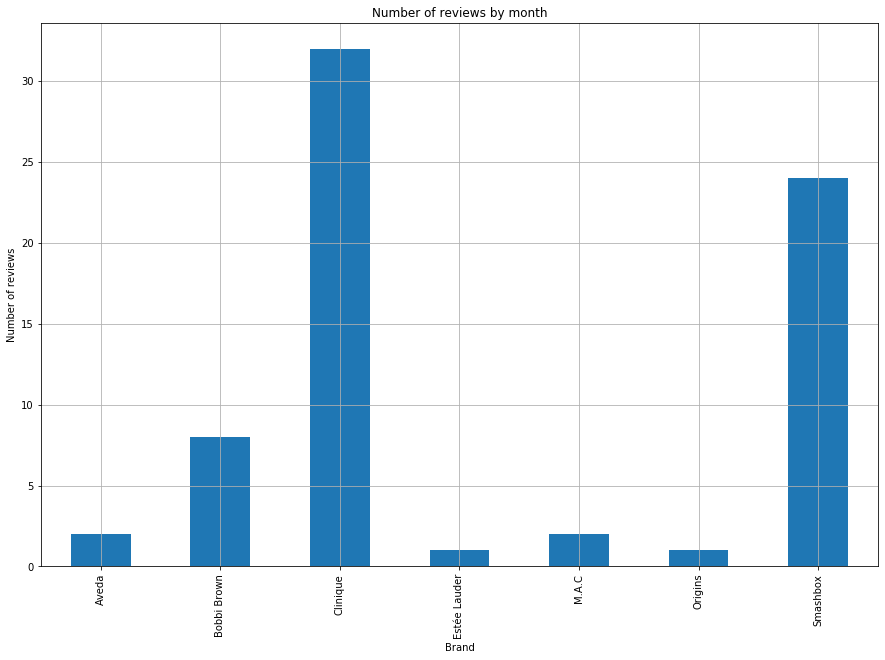

In [84]:
df.groupby('elc_brand')['nb_reviews'].sum().plot.bar(figsize=(15, 10))
plt.grid()
plt.xlabel('Brand')
plt.ylabel('Number of reviews')
plt.title('Number of reviews by month')

We see that the distribution is uneven. Pretty sure it's because different brands have different demand and therefore more reviews. Let's check that by adding the demand on another axis.

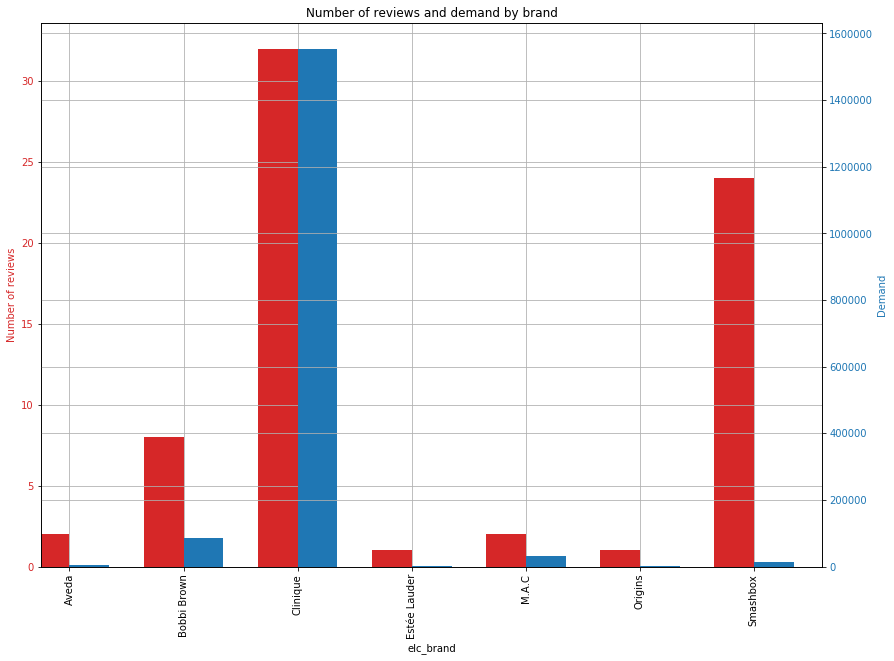

In [85]:
fig, ax1 = plt.subplots()

width = 0.35

color = 'tab:red'
ax1.set_xlabel('Brand')
ax1.set_ylabel('Number of reviews', color=color)
df.groupby('elc_brand')['nb_reviews'].sum().plot.bar(width=width, figsize=(14, 10), color=color, position=1)
# ax1.plot(t, data1, color=color)
ax1.tick_params(axis='y', labelcolor=color)
plt.grid()


plt.xticks(ticks=range(len(df['elc_brand'].unique())), labels=df['elc_brand'].unique(), rotation='vertical')

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('Demand', color=color)  # we already handled the x-label with ax1
df.groupby('elc_brand')['demand'].sum().plot.bar(width=width, figsize=(14, 10), color=color, position=0)
ax2.tick_params(axis='y', labelcolor=color)
plt.grid()

plt.title('Number of reviews and demand by brand')
plt.show()

We can see some correlation with makes sense...

### Frequency of ratings by month across all brands

Text(0.5, 1.0, 'Frequency of ratings by month')

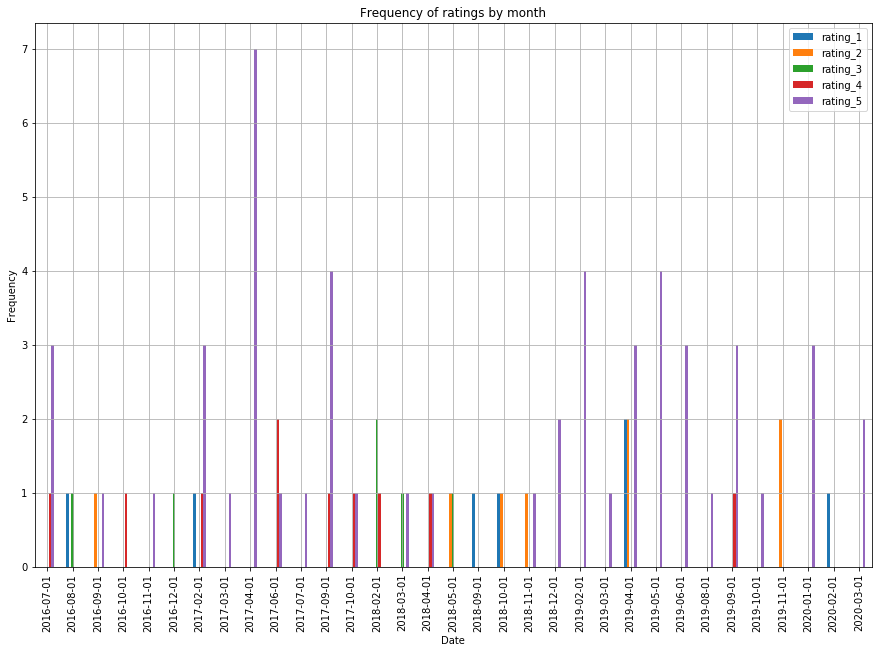

In [86]:
df[['date', 'rating_1', 'rating_2', 'rating_3', 'rating_4', 'rating_5']].groupby('date').sum().plot.bar(figsize=(15, 10))
plt.grid()
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.title('Frequency of ratings by month')

We see that 5-star ratings are clearly prevailing.

### Average rating by brand (Average over the months of the average rating per month)
**!!!** As apposed to the average over all the reviews. Indeed, $avg(avg(x, month))\neq avg(x)$. 

Here is a list of all the available brands. 

In [87]:
# Available brands
df['elc_brand'].unique().tolist()

['Bobbi Brown',
 'Clinique',
 'M.A.C',
 'Smashbox',
 'Aveda',
 'Estée Lauder',
 'Origins']

Add the brands for which you'd like to see the average rating over time to the *selected_brands* list in the next cell.

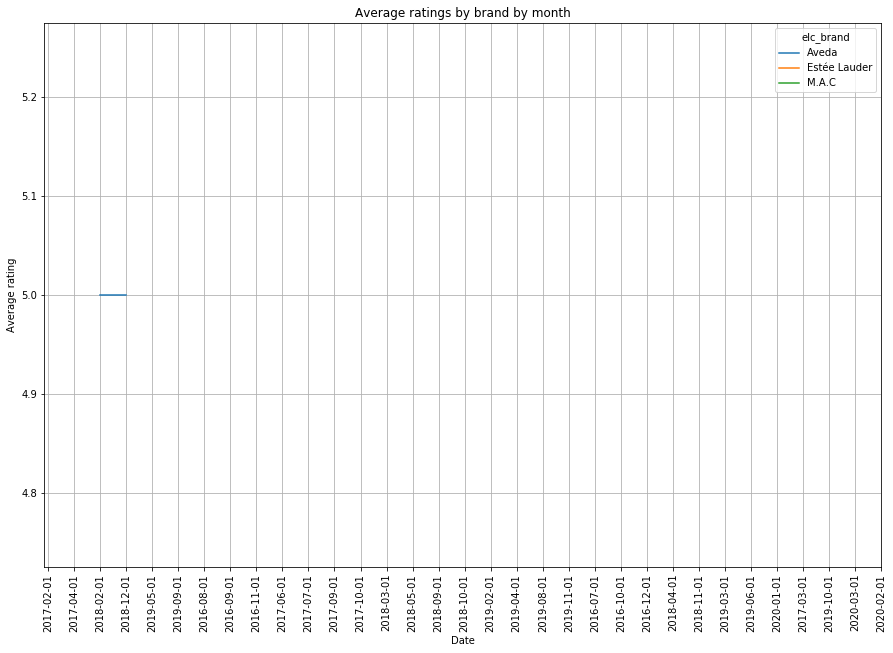

In [88]:
selected_brands = ['Aveda', 'M.A.C', 'Estée Lauder']
df[df['elc_brand'].isin(selected_brands)][['date', 'elc_brand', 'rating']].groupby(['date', 'elc_brand']).mean().unstack().droplevel(level=0,axis=1).plot.line(figsize=(15, 10))
plt.grid()
plt.xlabel('Date')
plt.ylabel('Average rating')
plt.title('Average ratings by brand by month')
plt.xticks(ticks=range(len(df['date'].unique())), labels=df['date'].unique(), rotation='vertical')
plt.show()

I noticed here that some brands did not get any ratings for some months. Maybe this shows that Rating and Reviews data that is scrapped is not of a very good quality **OR** perhaps there was 0 reviews for that brand ...

### Frequency of sentiments by month

Text(0.5, 1.0, 'Frequency of sentiments by month')

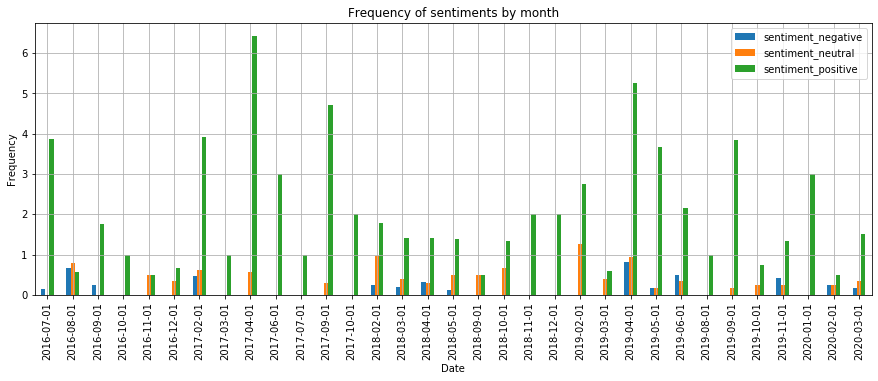

In [89]:
df[['date', 'sentiment_negative', 'sentiment_neutral', 'sentiment_positive']].groupby('date').sum().plot.bar(figsize=(15, 5))
plt.grid()
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.title('Frequency of sentiments by month')

Again we see here that positive sentiments prevail.

### Average sentiment by brand  (Average over the months of the average rating per month)
**!!!** As apposed to the average over all the reviews. Indeed, $avg(avg(x, month))\neq avg(x)$. 

Add the brands for which you'd like to see the average sentiment over time to the *selected_brands* list in the next cell.

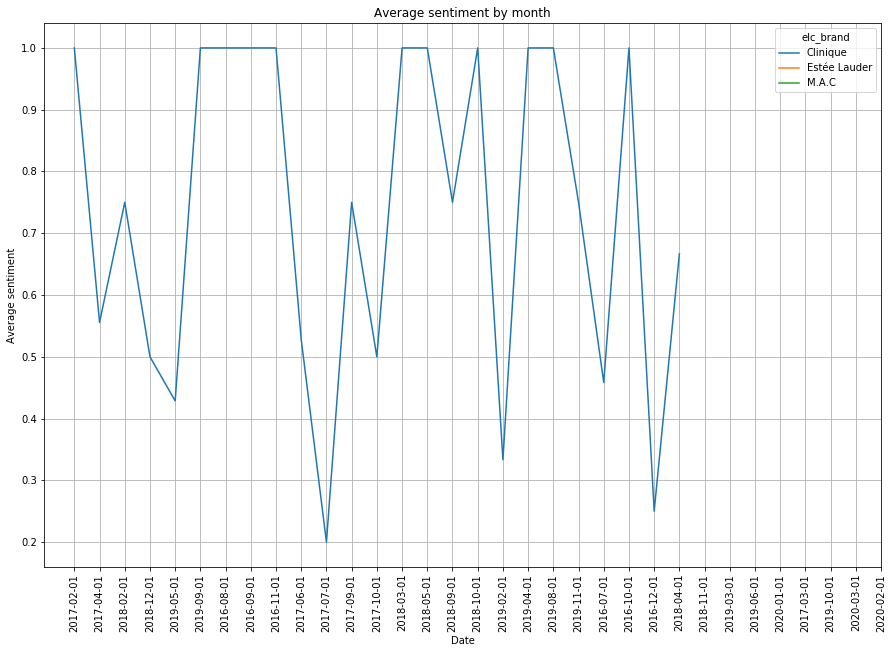

In [90]:
selected_brands = ['Clinique', 'M.A.C', 'Estée Lauder']
df[df['elc_brand'].isin(selected_brands)][['date', 'elc_brand', 'sentiment']].groupby(['date', 'elc_brand']).mean().unstack().droplevel(level=0,axis=1).plot.line(figsize=(15, 10))
plt.grid()
plt.xlabel('Date')
plt.ylabel('Average sentiment')
plt.title('Average sentiment by month')
plt.xticks(ticks=range(len(df['date'].unique())), labels=df['date'].unique(), rotation='vertical')
plt.show()

### Ratings (avg by brand) and Demand by month

Finally, we plot the average rating by brand and the increase in demand month over month in %.

=============================================== Bobbi Brown ===============================================


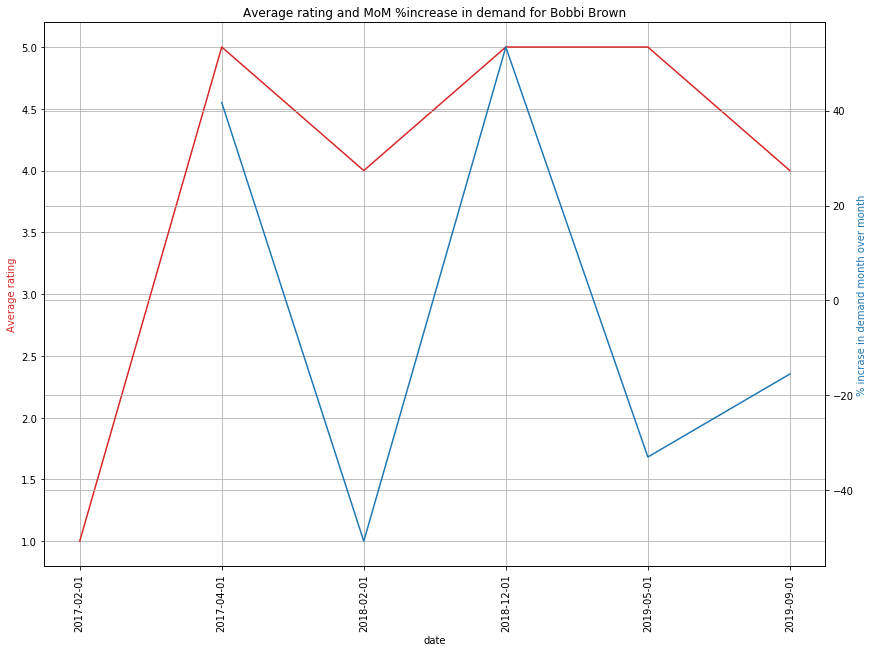

=============================================== Clinique ===============================================


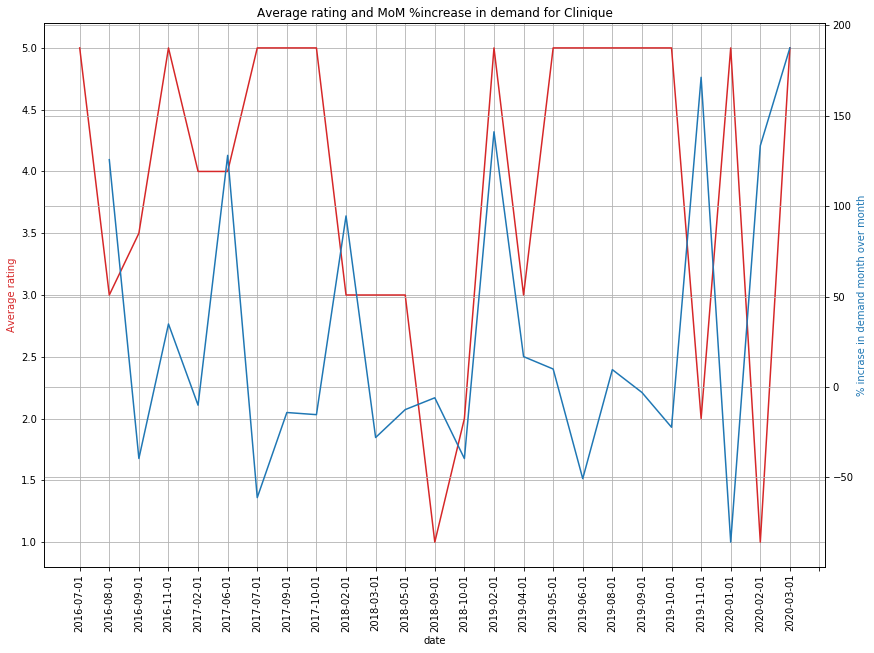

=============================================== M.A.C ===============================================


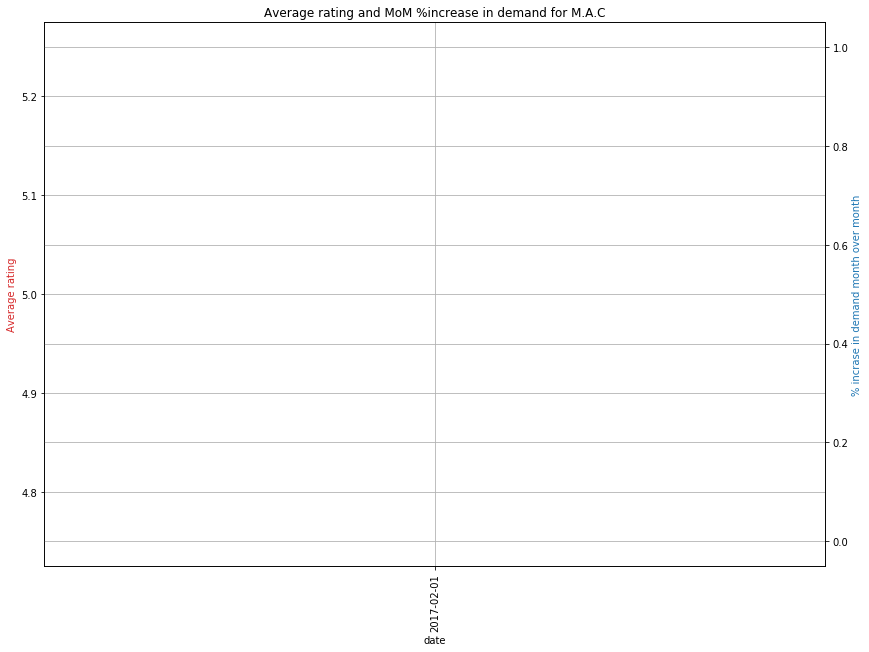

=============================================== Smashbox ===============================================


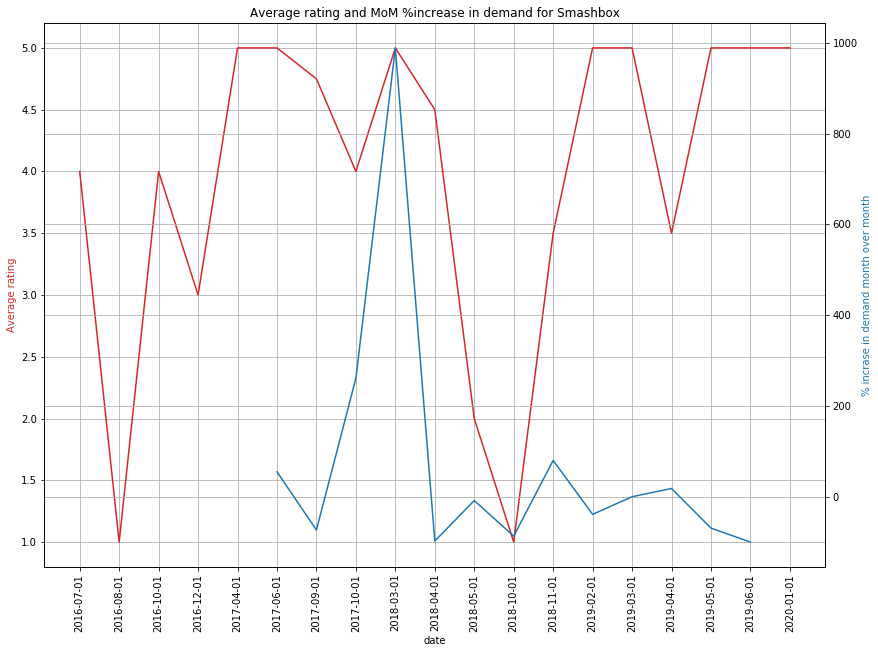

=============================================== Aveda ===============================================


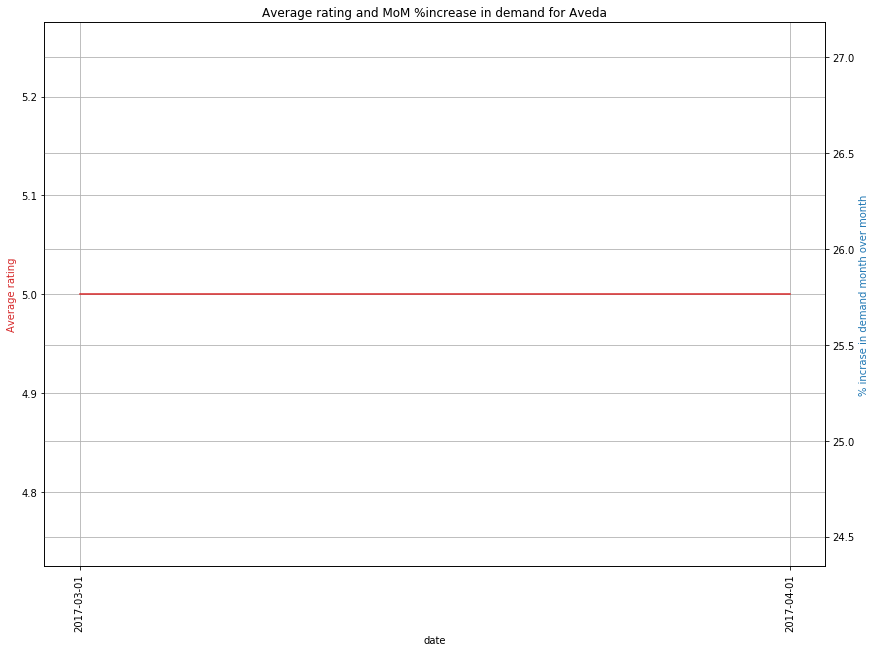

=============================================== Estée Lauder ===============================================


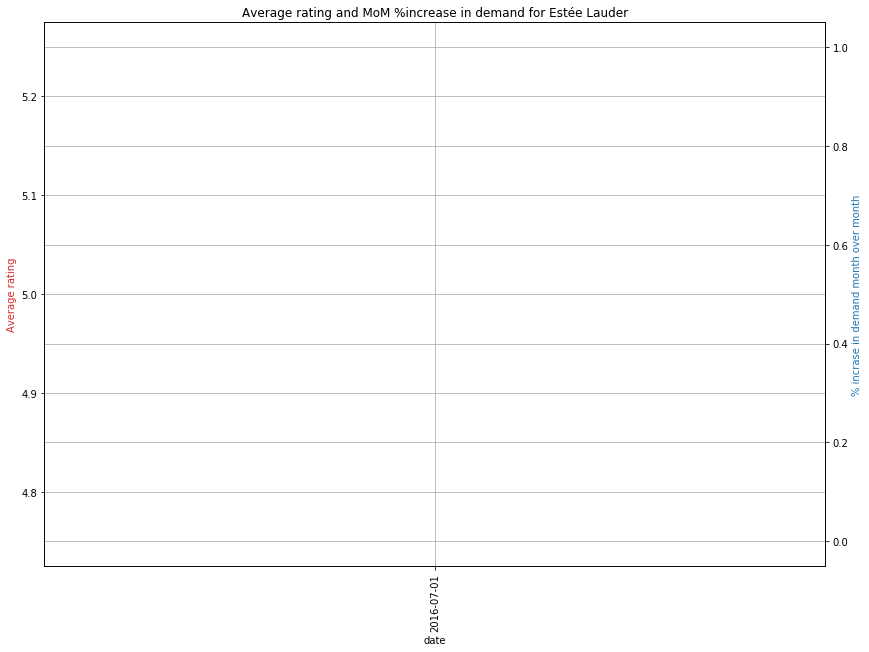

=============================================== Origins ===============================================


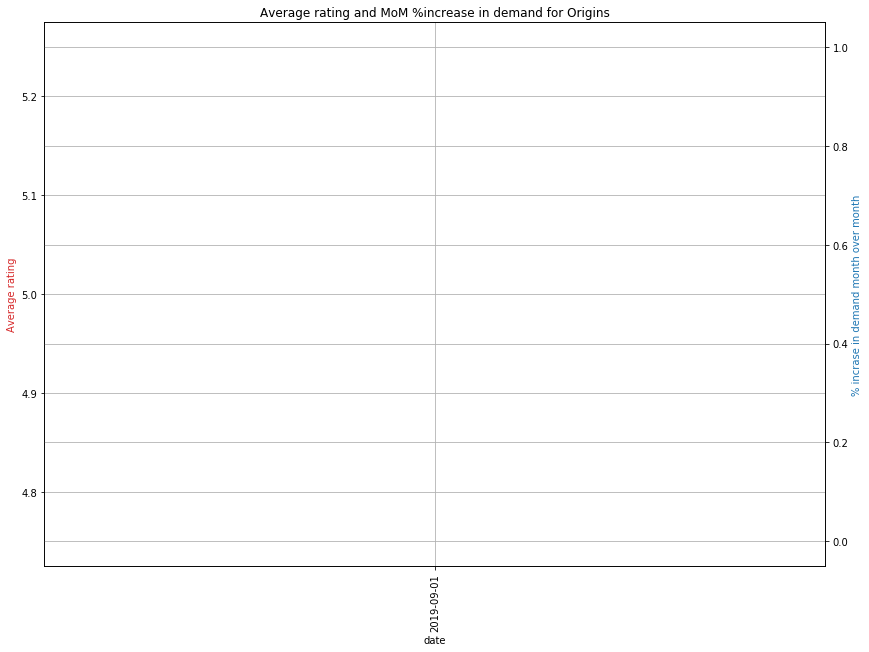

In [91]:
for brand in df['elc_brand'].unique():
    print('=============================================== {} ==============================================='.format(brand))
    fig, ax1 = plt.subplots()

    color = 'tab:red'
    ax1.set_xlabel('Brand')
    ax1.set_ylabel('Average rating', color=color)
    df[df['elc_brand']==brand].groupby('date')['rating'].mean().plot.line(figsize=(14, 10), color=color)
    plt.grid()

    plt.xticks(ticks=range(len(df['date'].unique())), labels=df['date'].unique(), rotation='vertical')

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel('% incrase in demand month over month', color=color)  # we already handled the x-label with ax1
    (df[df['elc_brand']==brand].groupby('date')['demand'].sum().diff().div(df[df['elc_brand']==brand].groupby('date')['demand'].sum().shift())*100).plot.line(figsize=(14, 10), color=color)
    plt.grid()
    
    plt.title('Average rating and MoM %increase in demand for {}'.format(brand))
    plt.show()

I can't see any solid clear trends in these graphs... I also noticed that for some brands we have a lot of missing demand data (missing or non-existing)...

### Demand vs Rating 

=========================================== Bobbi Brown ===========================================


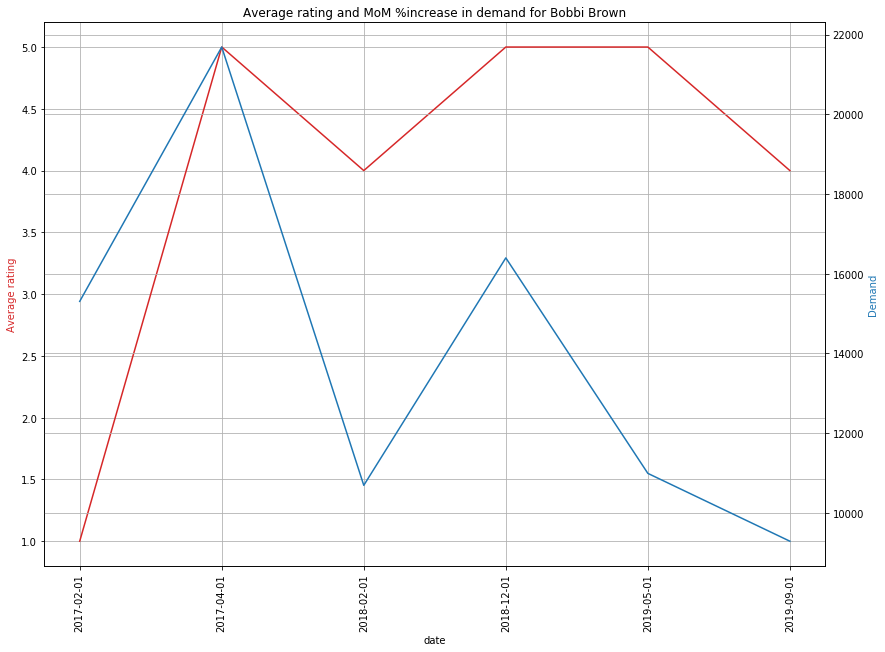

=========================================== Clinique ===========================================


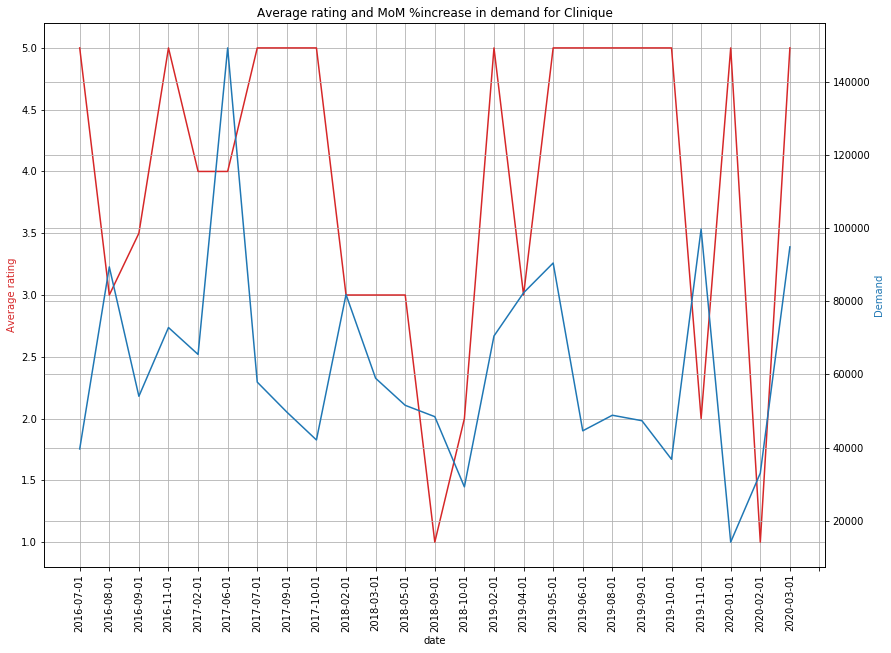

=========================================== M.A.C ===========================================


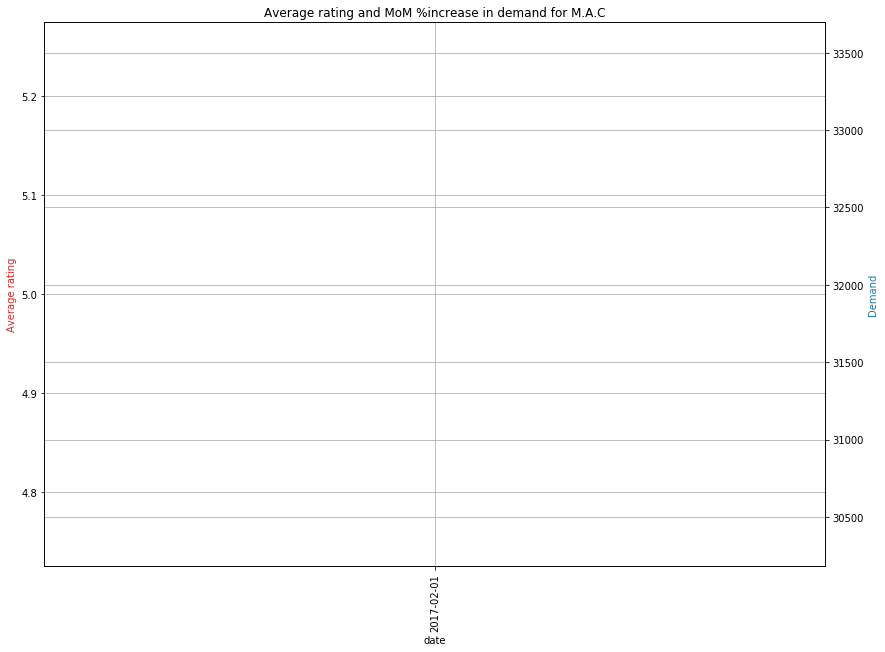

=========================================== Smashbox ===========================================


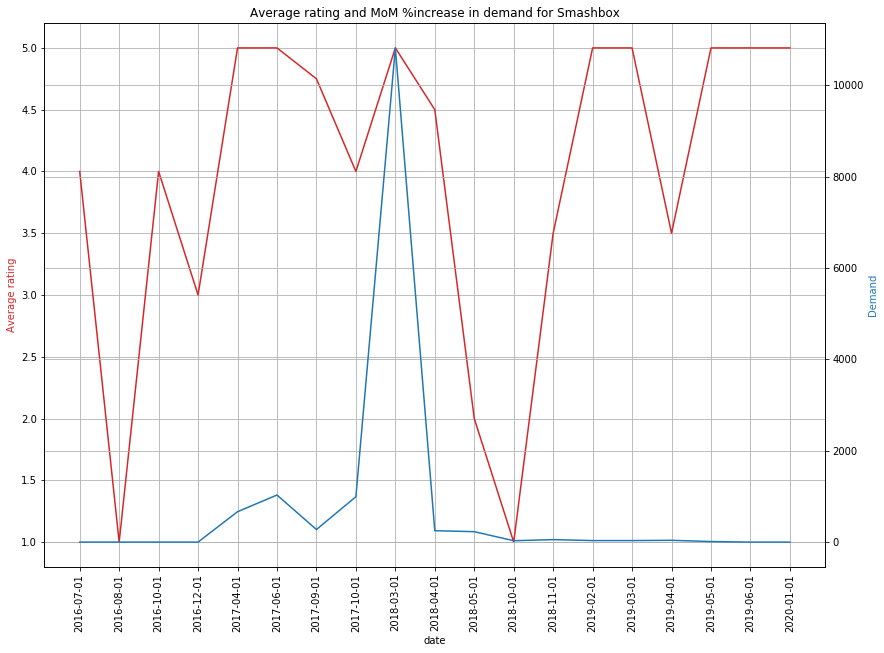

=========================================== Aveda ===========================================


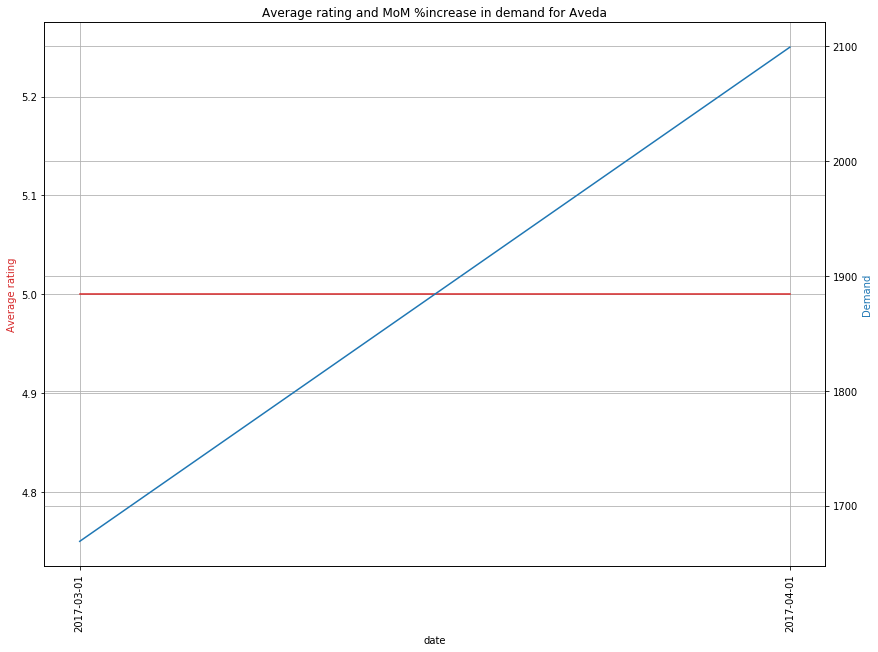

=========================================== Estée Lauder ===========================================


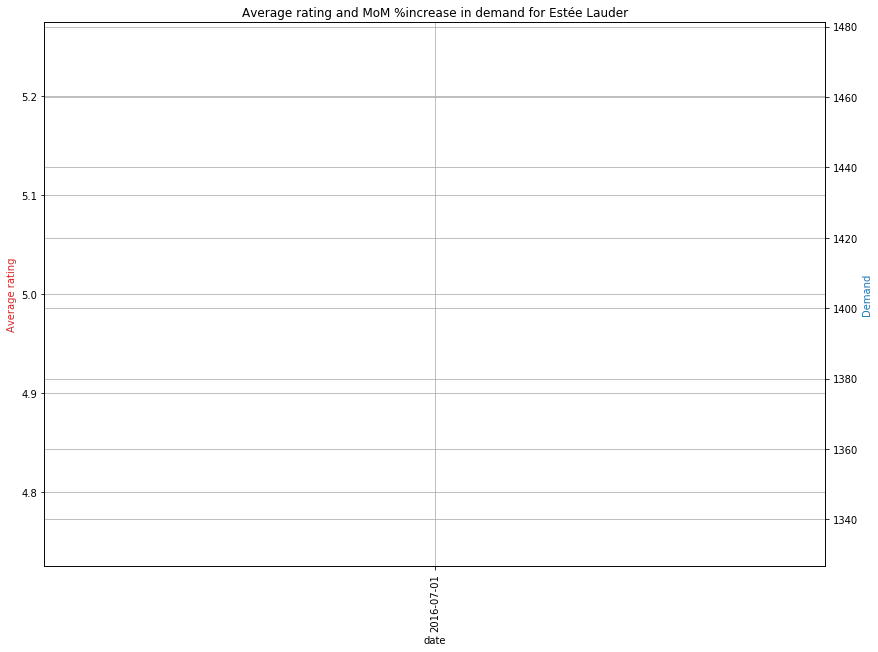

=========================================== Origins ===========================================


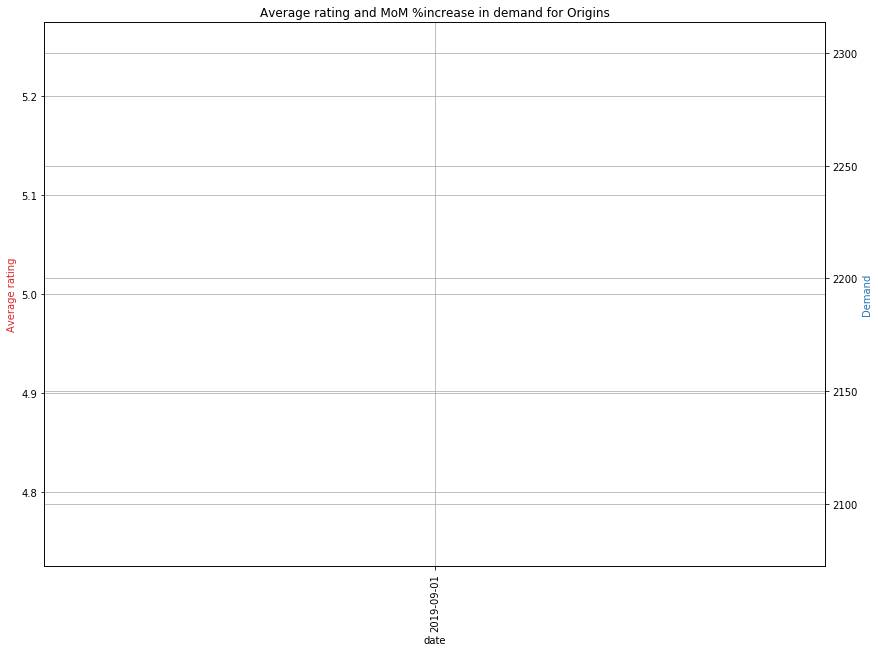

In [92]:
for brand in df['elc_brand'].unique(): 
    print('=========================================== {} ==========================================='.format(brand))
    fig, ax1 = plt.subplots()

    color = 'tab:red'
    ax1.set_xlabel('Brand')
    ax1.set_ylabel('Average rating', color=color)
    df[df['elc_brand']==brand].groupby('date')['rating'].mean().plot.line(figsize=(14, 10), color=color)
    plt.grid()

    plt.xticks(ticks=range(len(df['date'].unique())), labels=df['date'].unique(), rotation='vertical')

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel('Demand', color=color)  # we already handled the x-label with ax1
    df[df['elc_brand']==brand].groupby('date')['demand'].sum().plot.line(figsize=(14, 10), color=color)
    plt.grid()
    
    plt.title('Average rating and MoM %increase in demand for {}'.format(brand))
    plt.show()

## Model 0 : Everything in the soup

In [93]:
lm = LinearRegression()
lm.fit(X,y)
params = np.append(lm.intercept_,lm.coef_)
predictions = lm.predict(X)

newX = pd.DataFrame({"Constant":np.ones(len(X))}).join(pd.DataFrame(X))
MSE = (sum((y-predictions)**2))/(len(newX)-len(newX.columns))

# Note if you don't want to use a DataFrame replace the two lines above with
# newX = np.append(np.ones((len(X),1)), X, axis=1)
# MSE = (sum((y-predictions)**2))/(len(newX)-len(newX[0]))

var_b = MSE*(np.linalg.inv(np.dot(newX.T,newX)).diagonal())
sd_b = np.sqrt(var_b)
ts_b = params/ sd_b

p_values =[2*(1-stats.t.cdf(np.abs(i),(len(newX)-1))) for i in ts_b]

sd_b = np.round(sd_b,3)
ts_b = np.round(ts_b,3)
p_values = np.round(p_values,3)
params = np.round(params,4)

myDF3 = pd.DataFrame()
myDF3["Coefficients"],myDF3["Standard Errors"],myDF3["t values"],myDF3["Probabilities"] = [params,sd_b,ts_b,p_values]
print(myDF3)

NameError: name 'X' is not defined

We start with a model that uses both Ratings and Sentiments. The data we have ranges from 

In [ ]:
train = df[df['date'] <= '2018-12-01']
X_train = train.iloc[:, 5:-1]
X_train = sm.add_constant(X_train)
y_train = train.iloc[:, -1]
X_train

In [ ]:
train = df[df['date'] <= '2018-12-01']
X_train = train.iloc[:, 4:-1]
X_train = sm.add_constant(X_train)
y_train = train.iloc[:, -1]

test = df[df['date'] > '2018-12-01']
X_test = test.iloc[:, 4:-1]
X_test = sm.add_constant(X_test)
y_test = test.iloc[:, -1]

olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()

print(olsres.summary())

The coefficients for the ratings are all negative. Those of the sentiment are all positive and we have a small warning about some very small eigenvalue. That is because there is a lot of correlation between the features. Let's look at the correlation between our variables.

In [ ]:
train.iloc[:, 4:-1].corr()

In [ ]:
f = plt.figure(figsize=(19, 15))
plt.matshow(train.iloc[:, 4:-1].corr(), fignum=f.number, cmap='RdBu', vmin=-1, vmax=1)
plt.xticks(range(train.iloc[:, 4:-1].shape[1]), train.iloc[:, 4:-1].columns, fontsize=14, rotation=45)
plt.yticks(range(train.iloc[:, 4:-1].shape[1]), train.iloc[:, 4:-1].columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

We see a correlation between the ratings and the sentiments (rating_5 with sentiment_positive and vice-versa). But the sentiments are also correlated between themselves which is probably *no bueno*. This is due to the fact that we are using onehot encodings with counts. If the number of reviews increases, rating_1 to rating_5 are likely to increase too...

Let's quickly try some feature selection.

## Model 1 : demand = f(nb_reviews, rating, sentiment)

In [ ]:
train = df[df['date'] <= '2018-12-01']
X_train = train.iloc[:, 4:7]
X_train = sm.add_constant(X_train)
y_train = train.iloc[:, -1]

test = df[df['date'] > '2018-12-01']
X_test = test.iloc[:, 4:-4]
X_test = sm.add_constant(X_test)
y_test = test.iloc[:, -1]

olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()

print(olsres.summary())


Import Data

In [ ]:
df = pd.read_csv("../data/Global Demand Data Wrangling/output/monthly_product_demand.csv")
demand['demand'] = pd.to_numeric(demand['demand'].str.replace(',', ''), errors='coerce')

Filter out demand forecast data

In [ ]:
demand["datetime"] = pd.to_datetime(demand["month_date"])
CUTOFF = datetime.datetime(2020, 2, 1)
demand = demand.loc[demand["datetime"]<= CUTOFF]

In [ ]:
demand

Create demand lags

In [ ]:
demand["demand_lag_1"] = demand.groupby("ItemID 4")["demand"].shift()
demand["demand_lag_2"] = demand.groupby("ItemID 4")["demand"].shift(2)
demand["demand_lag_3"] = demand.groupby("ItemID 4")["demand"].shift(3)
demand.dropna(inplace=True)